# **About**

**About Dataset**

**Context**

The Challenge - One challenge of modeling retail data is the need to make decisions based on limited history. Holidays and select major events come once a year, and so does the chance to see how strategic decisions impacted the bottom line. In addition, markdowns are known to affect sales – the challenge is to predict which departments will be affected and to what extent.

**Content**

You are provided with historical sales data for 45 stores located in different regions - each store contains a number of departments. The company also runs several promotional markdown events throughout the year. These markdowns precede prominent holidays, the four largest of which are the Super Bowl, Labor Day, Thanksgiving, and Christmas. The weeks including these holidays are weighted five times higher in the evaluation than non-holiday weeks.

Within the Excel Sheet, there are 3 Tabs – Stores, Features and Sales

**The Task**

1. Predict the department-wide sales for each store for the following year
2. Model the effects of markdowns on holiday weeks
3. Provide recommended actions based on the insights drawn, with prioritization placed on largest business impact

# **Import**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
# import sklearn as sk
from datetime import datetime, timedelta
import plotly.express as px
import statsmodels.api as sm

from pandas.plotting import scatter_matrix
# from sklearn.cluster import KMeans
from yellowbrick.cluster import SilhouetteVisualizer
# from sklearn.preprocessing import MinMaxScaler  # Transform features by scaling each feature to a given range  #Sensitive with outlier, scaling using Min (0) and Max (1), Result between range 0 and 1
# from sklearn.preprocessing import StandardScaler# Transform features by scaling each feature to a given range  #Standard deviation, count range from mean to standard deviation
# from sklearn.preprocessing import RobustScaler  # Transform features by scaling each feature to a given range  #If there is any outlier we can use RobustScaler
# from sklearn import cluster                     # library that contains algorithms for segmenting
# from silhoutte import silhoutte_analysis        # used to study the separation distance between the resulting clusters

# **Load Dataset**

## Dictionary

**Stores**

Anonymized information about the 45 stores, indicating the type and size of store

**Features**

Contains additional data related to the store, department, and regional activity for the given dates.



*   Store - the store number
*   Date - the week
*   Temperature - average temperature in the region
*   Fuel_Price - cost of fuel in the region
*   MarkDown1-5 - anonymized data related to promotional markdowns. MarkDown *  data is only available after Nov 2011, and is not available for all stores all the time. Any missing value is marked with an NA
*   CPI - the consumer price index
*   Unemployment - the unemployment rate
*   IsHoliday - whether the week is a special holiday week



**Sales**

Historical sales data, which covers to 2010-02-05 to 2012-11-01. Within this tab you will find the following fields:

*   Store - the store number
*   Dept - the department number
*   Date - the week
*   Weekly_Sales -  sales for the given department in the given store
*   IsHoliday - whether the week is a special holiday week

## Dataset

In [2]:
url1 = 'https://raw.githubusercontent.com/shaviram99/Retail-Sales/main/Features%20data%20set.csv'
df_features = pd.read_csv(url1)
df_features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8190 entries, 0 to 8189
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         8190 non-null   int64  
 1   Date          8190 non-null   object 
 2   Temperature   8190 non-null   float64
 3   Fuel_Price    8190 non-null   float64
 4   MarkDown1     4032 non-null   float64
 5   MarkDown2     2921 non-null   float64
 6   MarkDown3     3613 non-null   float64
 7   MarkDown4     3464 non-null   float64
 8   MarkDown5     4050 non-null   float64
 9   CPI           7605 non-null   float64
 10  Unemployment  7605 non-null   float64
 11  IsHoliday     8190 non-null   bool   
dtypes: bool(1), float64(9), int64(1), object(1)
memory usage: 712.0+ KB


In [3]:
url2 = 'https://raw.githubusercontent.com/shaviram99/Retail-Sales/main/sales%20data-set.csv'
df_sales = pd.read_csv(url2)
df_sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 421570 entries, 0 to 421569
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Store         421570 non-null  int64  
 1   Dept          421570 non-null  int64  
 2   Date          421570 non-null  object 
 3   Weekly_Sales  421570 non-null  float64
 4   IsHoliday     421570 non-null  bool   
dtypes: bool(1), float64(1), int64(2), object(1)
memory usage: 13.3+ MB


In [4]:
url3 = 'https://raw.githubusercontent.com/shaviram99/Retail-Sales/main/stores%20data-set.csv'
df_stores = pd.read_csv(url3)
df_stores.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45 entries, 0 to 44
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Store   45 non-null     int64 
 1   Type    45 non-null     object
 2   Size    45 non-null     int64 
dtypes: int64(2), object(1)
memory usage: 1.2+ KB


## Merge dataset


In [5]:
df_1 = pd.merge(df_stores, df_sales, on='Store')
df_1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 421570 entries, 0 to 421569
Data columns (total 7 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Store         421570 non-null  int64  
 1   Type          421570 non-null  object 
 2   Size          421570 non-null  int64  
 3   Dept          421570 non-null  int64  
 4   Date          421570 non-null  object 
 5   Weekly_Sales  421570 non-null  float64
 6   IsHoliday     421570 non-null  bool   
dtypes: bool(1), float64(1), int64(3), object(2)
memory usage: 22.9+ MB


In [6]:
df_1.head()

,Store,Type,Size,Dept,Date,Weekly_Sales,IsHoliday
0,1,A,151315,1,05/02/2010,24924.50,False
1,1,A,151315,1,12/02/2010,46039.49,True
2,1,A,151315,1,19/02/2010,41595.55,False
3,1,A,151315,1,26/02/2010,19403.54,False
4,1,A,151315,1,05/03/2010,21827.90,False


In [7]:
df_final=pd.merge(df_features,df_1, on=('Store', 'Date', 'IsHoliday'))
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 421570 entries, 0 to 421569
Data columns (total 16 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Store         421570 non-null  int64  
 1   Date          421570 non-null  object 
 2   Temperature   421570 non-null  float64
 3   Fuel_Price    421570 non-null  float64
 4   MarkDown1     150681 non-null  float64
 5   MarkDown2     111248 non-null  float64
 6   MarkDown3     137091 non-null  float64
 7   MarkDown4     134967 non-null  float64
 8   MarkDown5     151432 non-null  float64
 9   CPI           421570 non-null  float64
 10  Unemployment  421570 non-null  float64
 11  IsHoliday     421570 non-null  bool   
 12  Type          421570 non-null  object 
 13  Size          421570 non-null  int64  
 14  Dept          421570 non-null  int64  
 15  Weekly_Sales  421570 non-null  float64
dtypes: bool(1), float64(10), int64(3), object(2)
memory usage: 51.9+ MB


In [8]:
df_final.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday,Type,Size,Dept,Weekly_Sales
0,1,05/02/2010,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,A,151315,1,24924.50
1,1,05/02/2010,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,A,151315,2,50605.27
2,1,05/02/2010,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,A,151315,3,13740.12
3,1,05/02/2010,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,A,151315,4,39954.04
4,1,05/02/2010,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,A,151315,5,32229.38


# **DATA CLEANING**

In [9]:
df_final2= df_final.copy()

In [10]:
df_final2.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday,Type,Size,Dept,Weekly_Sales
0,1,05/02/2010,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,A,151315,1,24924.50
1,1,05/02/2010,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,A,151315,2,50605.27
2,1,05/02/2010,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,A,151315,3,13740.12
3,1,05/02/2010,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,A,151315,4,39954.04
4,1,05/02/2010,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,A,151315,5,32229.38


## I. Removing Duplicate

In [11]:
#Duplicate not found in dataset
df_final2.duplicated().sum()

0

## II. Removing Irrelevant Value

In [12]:
#Check typos
for i in df_final2.columns:
  unique_data = df_final2[i].value_counts()
  print(unique_data,'\n')

13    10474
10    10315
4     10272
1     10244
2     10238
24    10228
27    10225
34    10224
20    10214
6     10211
32    10202
19    10148
31    10142
28    10113
41    10088
11    10062
23    10050
14    10040
40    10017
15     9901
8      9895
39     9878
17     9864
18     9859
26     9854
25     9804
7      9762
12     9705
22     9688
45     9637
21     9582
35     9528
29     9455
16     9443
3      9036
5      8999
9      8867
38     7362
37     7206
44     7169
30     7156
42     6953
43     6751
33     6487
36     6222
Name: Store, dtype: int64 

23/12/2011    3027
25/11/2011    3021
16/12/2011    3013
09/12/2011    3010
17/02/2012    3007
              ... 
09/07/2010    2903
16/07/2010    2901
20/08/2010    2901
27/08/2010    2898
13/08/2010    2896
Name: Date, Length: 143, dtype: int64 

50.43    709
67.87    646
72.62    594
76.67    583
70.28    563
        ... 
56.50     41
55.47     40
58.40     40
66.79     39
64.09     38
Name: Temperature, Length: 3528, dtype: 

## III. Handling Missing Value


In [13]:
# to check missing values
df_final2.isna().sum()

Store                0
Date                 0
Temperature          0
Fuel_Price           0
MarkDown1       270889
MarkDown2       310322
MarkDown3       284479
MarkDown4       286603
MarkDown5       270138
CPI                  0
Unemployment         0
IsHoliday            0
Type                 0
Size                 0
Dept                 0
Weekly_Sales         0
dtype: int64

In [14]:
# fill missing value with '0'
df_final2[['MarkDown1', 'MarkDown2', 'MarkDown3','MarkDown4', 'MarkDown5']]=df_final2[['MarkDown1', 'MarkDown2', 'MarkDown3','MarkDown4', 'MarkDown5']].fillna(0)

In [15]:
df_final2.isna().sum()

Store           0
Date            0
Temperature     0
Fuel_Price      0
MarkDown1       0
MarkDown2       0
MarkDown3       0
MarkDown4       0
MarkDown5       0
CPI             0
Unemployment    0
IsHoliday       0
Type            0
Size            0
Dept            0
Weekly_Sales    0
dtype: int64

In [16]:
df_final2.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday,Type,Size,Dept,Weekly_Sales
0,1,05/02/2010,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False,A,151315,1,24924.50
1,1,05/02/2010,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False,A,151315,2,50605.27
2,1,05/02/2010,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False,A,151315,3,13740.12
3,1,05/02/2010,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False,A,151315,4,39954.04
4,1,05/02/2010,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False,A,151315,5,32229.38


## IV. Convert Datatype


In [17]:
df_dtype=df_final2.copy()

In [18]:
df_dtype.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 421570 entries, 0 to 421569
Data columns (total 16 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Store         421570 non-null  int64  
 1   Date          421570 non-null  object 
 2   Temperature   421570 non-null  float64
 3   Fuel_Price    421570 non-null  float64
 4   MarkDown1     421570 non-null  float64
 5   MarkDown2     421570 non-null  float64
 6   MarkDown3     421570 non-null  float64
 7   MarkDown4     421570 non-null  float64
 8   MarkDown5     421570 non-null  float64
 9   CPI           421570 non-null  float64
 10  Unemployment  421570 non-null  float64
 11  IsHoliday     421570 non-null  bool   
 12  Type          421570 non-null  object 
 13  Size          421570 non-null  int64  
 14  Dept          421570 non-null  int64  
 15  Weekly_Sales  421570 non-null  float64
dtypes: bool(1), float64(10), int64(3), object(2)
memory usage: 51.9+ MB


In [19]:
df_dtype['Date'] = pd.to_datetime(df_dtype['Date'])
df_dtype[['Store', 'Dept']] = df_dtype[['Store', 'Dept']].astype(str) 
df_dtype.info()

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_7960\3657391607.py:1: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  df_dtype['Date'] = pd.to_datetime(df_dtype['Date'])


<class 'pandas.core.frame.DataFrame'>
Int64Index: 421570 entries, 0 to 421569
Data columns (total 16 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   Store         421570 non-null  object        
 1   Date          421570 non-null  datetime64[ns]
 2   Temperature   421570 non-null  float64       
 3   Fuel_Price    421570 non-null  float64       
 4   MarkDown1     421570 non-null  float64       
 5   MarkDown2     421570 non-null  float64       
 6   MarkDown3     421570 non-null  float64       
 7   MarkDown4     421570 non-null  float64       
 8   MarkDown5     421570 non-null  float64       
 9   CPI           421570 non-null  float64       
 10  Unemployment  421570 non-null  float64       
 11  IsHoliday     421570 non-null  bool          
 12  Type          421570 non-null  object        
 13  Size          421570 non-null  int64         
 14  Dept          421570 non-null  object        
 15  Weekly_Sales  421

In [20]:
df_dtype.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday,Type,Size,Dept,Weekly_Sales
0,1,2010-05-02,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False,A,151315,1,24924.50
1,1,2010-05-02,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False,A,151315,2,50605.27
2,1,2010-05-02,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False,A,151315,3,13740.12
3,1,2010-05-02,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False,A,151315,4,39954.04
4,1,2010-05-02,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False,A,151315,5,32229.38


In [21]:
#to change column name 'date' to 'date_transaction
df_dtype.rename(columns = {'Date' : 'Date_tranx'}, inplace=True)
df_dtype.head()

,Store,Date_tranx,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday,Type,Size,Dept,Weekly_Sales
0,1,2010-05-02,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False,A,151315,1,24924.50
1,1,2010-05-02,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False,A,151315,2,50605.27
2,1,2010-05-02,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False,A,151315,3,13740.12
3,1,2010-05-02,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False,A,151315,4,39954.04
4,1,2010-05-02,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False,A,151315,5,32229.38


## VI. Handling Outlier


In [22]:
df_dtype1=df_dtype.copy()

In [23]:
df_dtype1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 421570 entries, 0 to 421569
Data columns (total 16 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   Store         421570 non-null  object        
 1   Date_tranx    421570 non-null  datetime64[ns]
 2   Temperature   421570 non-null  float64       
 3   Fuel_Price    421570 non-null  float64       
 4   MarkDown1     421570 non-null  float64       
 5   MarkDown2     421570 non-null  float64       
 6   MarkDown3     421570 non-null  float64       
 7   MarkDown4     421570 non-null  float64       
 8   MarkDown5     421570 non-null  float64       
 9   CPI           421570 non-null  float64       
 10  Unemployment  421570 non-null  float64       
 11  IsHoliday     421570 non-null  bool          
 12  Type          421570 non-null  object        
 13  Size          421570 non-null  int64         
 14  Dept          421570 non-null  object        
 15  Weekly_Sales  421

### By Boxplot


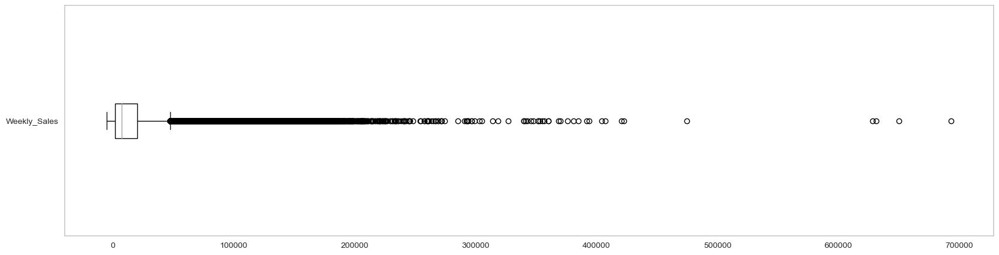

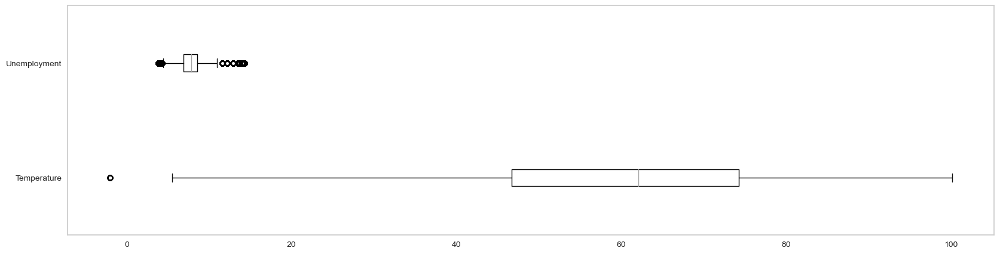

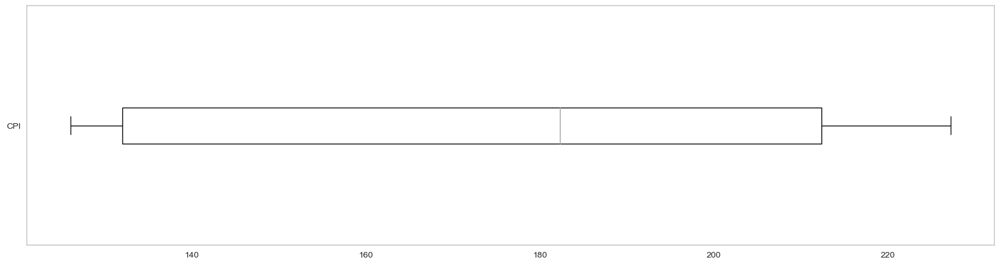

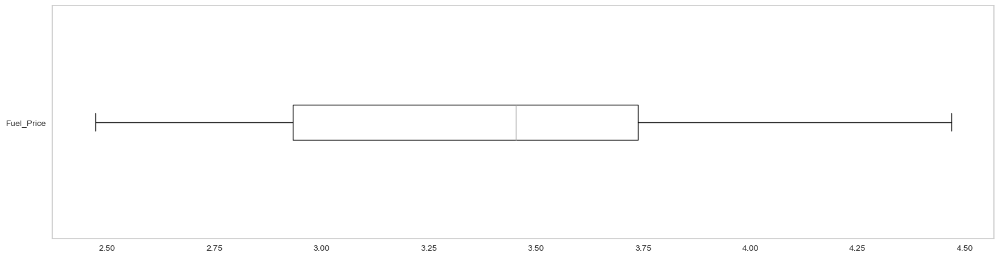

In [24]:
# Creat boxplot to see outlier 
df_dtype1.boxplot(column=['Weekly_Sales'], fontsize=10, rot=0, grid=False, figsize=(20,5), vert=False)
plt.show()
df_dtype1.boxplot(column=['Temperature','Unemployment'], fontsize=10, rot=0, grid=False, figsize=(20,5), vert=False)
plt.show()
df_dtype1.boxplot(column=['CPI'], fontsize=10, rot=0, grid=False, figsize=(20,5), vert=False)
plt.show()
df_dtype1.boxplot(column=['Fuel_Price'], fontsize=10, rot=0, grid=False, figsize=(20,5), vert=False)
plt.show()

Too many outliers on weekly sales and some outlier on 'Temperature','Unemployment'


### By Upper Lower Fence


#### Weekly_Sales


In [25]:
df_dtype1_outlier = df_dtype1.copy()

In [26]:
#check oulier with Q1 and Q3 ( that value < Q1 - 1,5 IQR and > Q3 + 1,5 IQR)
Q1Weekly_Sales = df_dtype1_outlier['Weekly_Sales'].quantile(0.25)
Q3Weekly_Sales = df_dtype1_outlier['Weekly_Sales'].quantile(0.75)

IQRWeekly_Sales = Q3Weekly_Sales - Q1Weekly_Sales
lower_fence_Weekly_Sales = Q1Weekly_Sales - 1.5 * IQRWeekly_Sales
upper_fence_Weekly_Sales = Q3Weekly_Sales + 1.5 * IQRWeekly_Sales

print('Q1Weekly_Sale:', Q1Weekly_Sales)
print('Q3Weekly_Sale:', Q3Weekly_Sales)
print('IQRWeekly_Sale:', IQRWeekly_Sales)
print('Lower Fence Weekly_Sale:', lower_fence_Weekly_Sales)
print('Upper Fence Weekly_Sale:', upper_fence_Weekly_Sales)

Q1Weekly_Sale: 2079.6499999999996
Q3Weekly_Sale: 20205.8525
IQRWeekly_Sale: 18126.2025
Lower Fence Weekly_Sale: -25109.653749999998
Upper Fence Weekly_Sale: 47395.15625


In [27]:
#to know percentage of outlier
df_sales_begin = len(df_dtype1)
Weekly_Sales_outlier = len(df_dtype1_outlier[(df_dtype1_outlier['Weekly_Sales']<lower_fence_Weekly_Sales) | (df_dtype1_outlier['Weekly_Sales']>upper_fence_Weekly_Sales)])

print('Data before remove outlier: ', df_sales_begin)
print('Number of outlier: ', Weekly_Sales_outlier)
print('Percentage of outlier: ', round(Weekly_Sales_outlier/df_sales_begin*100,2), '%')


Data before remove outlier:  421570
Number of outlier:  35521
Percentage of outlier:  8.43 %


we got the percentage of outlier is 8.43 %, this is a small number of percentage so drop the outlier


In [28]:

Weekly_Sale_lower_out = df_dtype1_outlier['Weekly_Sales']<lower_fence_Weekly_Sales
Weekly_Sale_upper_out = df_dtype1_outlier['Weekly_Sales']>upper_fence_Weekly_Sales
df_dtype1_outlier = df_dtype1_outlier.loc[~(Weekly_Sale_lower_out | Weekly_Sale_upper_out)]

df_dtype1_outlier.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 386049 entries, 0 to 421569
Data columns (total 16 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   Store         386049 non-null  object        
 1   Date_tranx    386049 non-null  datetime64[ns]
 2   Temperature   386049 non-null  float64       
 3   Fuel_Price    386049 non-null  float64       
 4   MarkDown1     386049 non-null  float64       
 5   MarkDown2     386049 non-null  float64       
 6   MarkDown3     386049 non-null  float64       
 7   MarkDown4     386049 non-null  float64       
 8   MarkDown5     386049 non-null  float64       
 9   CPI           386049 non-null  float64       
 10  Unemployment  386049 non-null  float64       
 11  IsHoliday     386049 non-null  bool          
 12  Type          386049 non-null  object        
 13  Size          386049 non-null  int64         
 14  Dept          386049 non-null  object        
 15  Weekly_Sales  386

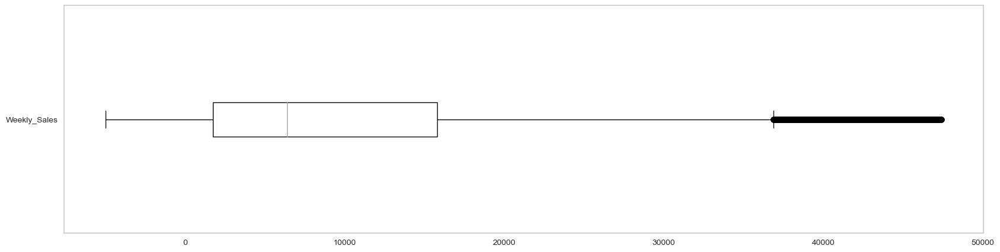

In [29]:

# boxplot clean data
df_dtype1_outlier.boxplot(column=['Weekly_Sales'], fontsize=10,rot=0,grid=False,figsize=(20,5),vert=False)
plt.show()


#### Temperature


In [30]:
df_dtype1_outlier2 = df_dtype1_outlier.copy()


In [31]:
#check oulier with Q1 and Q3 ( that value < Q1 - 1,5 IQR and > Q3 + 1,5 IQR)
Q1temp = df_dtype1_outlier2['Temperature'].quantile(0.25)
Q3temp = df_dtype1_outlier2['Temperature'].quantile(0.75)

IQRtemp = Q3temp - Q1temp
lower_fence_temp = Q1temp - 1.5 * IQRtemp
upper_fence_temp = Q3temp + 1.5 * IQRtemp

print('Q1temp:', Q1temp)
print('Q3temp:', Q3temp)
print('IQRtemp:', IQRtemp)
print('Lower Fence temp:', lower_fence_temp)
print('Upper Fence temp:', upper_fence_temp)


Q1temp: 46.66
Q3temp: 74.25
IQRtemp: 27.590000000000003
Lower Fence temp: 5.2749999999999915
Upper Fence temp: 115.635


In [32]:
#to know percentage of outlier
df_temp_begin = len(df_dtype1)
temp_outlier = len(df_dtype1_outlier2[(df_dtype1_outlier2['Temperature']<lower_fence_temp) | (df_dtype1_outlier2['Temperature']>upper_fence_temp)])

print('Data before remove outlier: ', df_temp_begin)
print('Number of outlier (weekly sales+temp): ', temp_outlier+Weekly_Sales_outlier)
print('Percentage of outlier: ', round((temp_outlier+Weekly_Sales_outlier)/df_temp_begin*100,2), '%')


Data before remove outlier:  421570
Number of outlier (weekly sales+temp):  35589
Percentage of outlier:  8.44 %


we got the percentage of outlier (weekly sales+temp) is 8.44 %, this is a small number of percentage so drop the outlier


In [33]:
temp_lower_out = df_dtype1_outlier2['Temperature']<lower_fence_temp
temp_upper_out = df_dtype1_outlier2['Temperature']>upper_fence_temp
df_dtype1_outlier2 = df_dtype1_outlier2.loc[~(temp_lower_out | temp_upper_out)]

df_dtype1_outlier2.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 385981 entries, 0 to 421569
Data columns (total 16 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   Store         385981 non-null  object        
 1   Date_tranx    385981 non-null  datetime64[ns]
 2   Temperature   385981 non-null  float64       
 3   Fuel_Price    385981 non-null  float64       
 4   MarkDown1     385981 non-null  float64       
 5   MarkDown2     385981 non-null  float64       
 6   MarkDown3     385981 non-null  float64       
 7   MarkDown4     385981 non-null  float64       
 8   MarkDown5     385981 non-null  float64       
 9   CPI           385981 non-null  float64       
 10  Unemployment  385981 non-null  float64       
 11  IsHoliday     385981 non-null  bool          
 12  Type          385981 non-null  object        
 13  Size          385981 non-null  int64         
 14  Dept          385981 non-null  object        
 15  Weekly_Sales  385

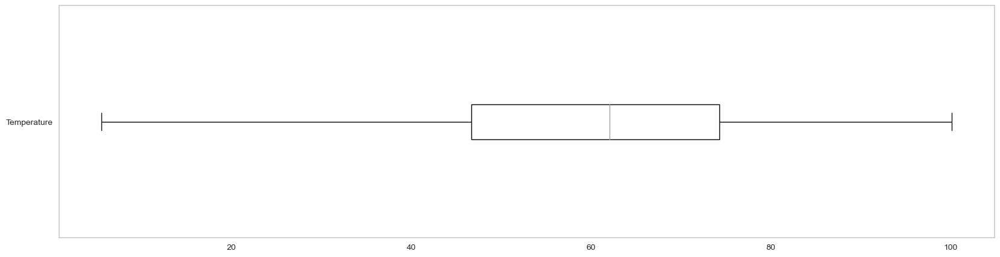

In [34]:
# boxplot clean data
df_dtype1_outlier2.boxplot(column=['Temperature'], fontsize=10,rot=0,grid=False,figsize=(20,5),vert=False)
plt.show()


#### Unemployed


In [35]:
df_dtype1_outlier3 = df_dtype1_outlier2.copy()


In [36]:
#check oulier with Q1 and Q3 ( that value < Q1 - 1,5 IQR and > Q3 + 1,5 IQR)
Q1Unemployment = df_dtype1_outlier3['Unemployment'].quantile(0.25)
Q3Unemployment= df_dtype1_outlier3['Unemployment'].quantile(0.75)

IQRUnemployment = Q3Unemployment - Q1Unemployment
lower_fence_Unemployment = Q1Unemployment - 1.5 * IQRUnemployment
upper_fence_Unemployment = Q3Unemployment + 1.5 * IQRUnemployment

print('Q1Unemployment:', Q1Unemployment)
print('Q3Unemployment:', Q3Unemployment)
print('IQRUnemployment:', IQRUnemployment)
print('Lower Fence Unemployment:', lower_fence_Unemployment)
print('Upper Fence Unemployment:', upper_fence_Unemployment)

Q1Unemployment: 6.885
Q3Unemployment: 8.595
IQRUnemployment: 1.7100000000000009
Lower Fence Unemployment: 4.3199999999999985
Upper Fence Unemployment: 11.160000000000002


In [37]:

#to know percentage of outlier
df_Unemployment_begin = len(df_dtype1)
Unemployment_outlier = len(df_dtype1_outlier3[(df_dtype1_outlier3['Unemployment']<lower_fence_Unemployment) | (df_dtype1_outlier3['Unemployment']>upper_fence_Unemployment)])

print('Data before remove outlier: ', df_Unemployment_begin)
print('Number of outlier (weekly sales+temp+Unemployment): ', temp_outlier+Weekly_Sales_outlier+Unemployment_outlier)
print('Percentage of outlier: ', round((temp_outlier+Weekly_Sales_outlier+Unemployment_outlier)/df_Unemployment_begin*100,2), '%')


Data before remove outlier:  421570
Number of outlier (weekly sales+temp+Unemployment):  65259
Percentage of outlier:  15.48 %



we got the percentage of outlier (weekly sales+temp+Unemployment) is 15.48 %, this is a big number of percentage so dont drop the outlier

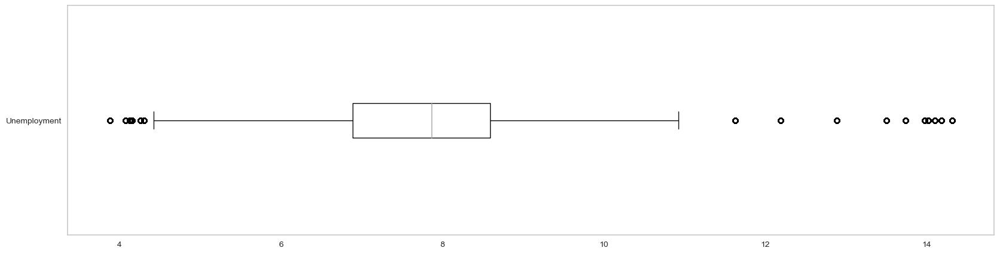

In [38]:

# boxplot clean data
df_dtype1_outlier3.boxplot(column=['Unemployment'], fontsize=10,rot=0,grid=False,figsize=(20,5),vert=False)
plt.show()

# Save File

In [39]:
# df_dtype1_outlier3.info()

In [40]:
# df_clean=df_dtype1_outlier3.copy()
# df_clean = df_clean.to_csv(r'C:\Users\LENOVO\Documents\revou\Portofolio\sales\final_clean_new.csv', index=False, header=True) 
# print(df_clean)

# Statistical Description

In [41]:
df_dtype1_outlier3.head()

,Store,Date_tranx,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday,Type,Size,Dept,Weekly_Sales
0,1,2010-05-02,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False,A,151315,1,24924.50
2,1,2010-05-02,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False,A,151315,3,13740.12
3,1,2010-05-02,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False,A,151315,4,39954.04
4,1,2010-05-02,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False,A,151315,5,32229.38
5,1,2010-05-02,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False,A,151315,6,5749.03


In [42]:
dfcleaned= df_dtype1_outlier3.copy()
dfcleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 385981 entries, 0 to 421569
Data columns (total 16 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   Store         385981 non-null  object        
 1   Date_tranx    385981 non-null  datetime64[ns]
 2   Temperature   385981 non-null  float64       
 3   Fuel_Price    385981 non-null  float64       
 4   MarkDown1     385981 non-null  float64       
 5   MarkDown2     385981 non-null  float64       
 6   MarkDown3     385981 non-null  float64       
 7   MarkDown4     385981 non-null  float64       
 8   MarkDown5     385981 non-null  float64       
 9   CPI           385981 non-null  float64       
 10  Unemployment  385981 non-null  float64       
 11  IsHoliday     385981 non-null  bool          
 12  Type          385981 non-null  object        
 13  Size          385981 non-null  int64         
 14  Dept          385981 non-null  object        
 15  Weekly_Sales  385

In [43]:
dfcleaned.describe()

,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Size,Weekly_Sales
count,385981.000000,385981.000000,385981.000000,385981.000000,385981.000000,385981.000000,385981.000000,385981.000000,385981.000000,385981.000000,385981.000000
mean,60.073072,3.361276,2529.932475,856.561980,434.594124,1050.844843,1615.551183,171.279147,7.971808,133759.546384,10544.959957
std,18.476641,0.459046,5962.523454,4952.382729,5259.350635,3823.615030,4106.576001,39.173228,1.876951,60976.612424,11327.290609
min,5.540000,2.472000,0.000000,-265.760000,-29.100000,0.000000,0.000000,126.064000,3.879000,34875.000000,-4988.940000
25%,46.670000,2.932000,0.000000,0.000000,0.000000,0.000000,0.000000,132.106200,6.885000,93188.000000,1756.080000
50%,62.070000,3.452000,0.000000,0.000000,0.000000,0.000000,0.000000,182.431557,7.866000,128107.000000,6373.640000
75%,74.250000,3.738000,2683.990000,1.750000,4.090000,407.170000,2099.050000,212.576205,8.595000,202307.000000,15803.100000
max,100.140000,4.468000,88646.760000,104519.540000,141630.610000,67474.850000,108519.280000,227.232807,14.313000,219622.000000,47393.430000


# Corelation

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_7960\2472346909.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = dfcleaned.corr()
C:\Users\LENOVO\AppData\Local\Temp\ipykernel_7960\2472346909.py:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.triu(np.ones_like(corr, dtype=np.bool))


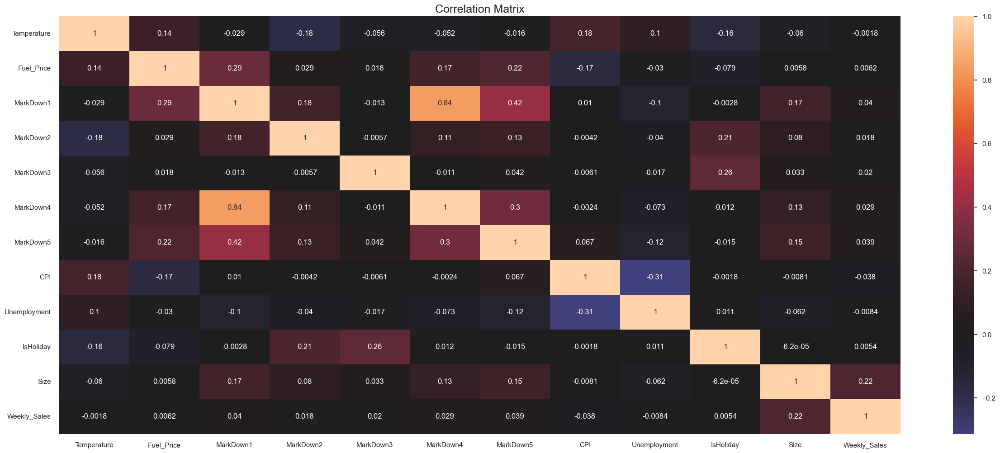

In [44]:
plt.figure(figsize=(30,12))
sns.set(style = "white")
corr = dfcleaned.corr()
mask = np.triu(np.ones_like(corr, dtype=np.bool))
# f, ax = plt.subplots(figsize=(20, 15))
cmap = sns.diverging_palette(220, 10, as_cmap=True)
plt.title('Correlation Matrix', fontsize=18)
sns.heatmap(corr, annot = True, center=0)
plt.show()

Between MarkDown1 and MarkDown 4 have high corellation value. Drop one of it to prevent Multi Collinearity

In [45]:
dfcorrelation=dfcleaned.copy()
dfcorrelation.head()

,Store,Date_tranx,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday,Type,Size,Dept,Weekly_Sales
0,1,2010-05-02,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False,A,151315,1,24924.50
2,1,2010-05-02,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False,A,151315,3,13740.12
3,1,2010-05-02,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False,A,151315,4,39954.04
4,1,2010-05-02,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False,A,151315,5,32229.38
5,1,2010-05-02,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False,A,151315,6,5749.03


In [46]:
#Drop Markdown 4 for cause multi-collinearity and drop MarkDown 3, CPI, IsHoliday cause no correlation
dfcorrelation=dfcorrelation.drop(columns=['MarkDown3', 'MarkDown4', 'CPI','IsHoliday'])
dfcorrelation.head()

,Store,Date_tranx,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown5,Unemployment,Type,Size,Dept,Weekly_Sales
0,1,2010-05-02,42.31,2.572,0.0,0.0,0.0,8.106,A,151315,1,24924.50
2,1,2010-05-02,42.31,2.572,0.0,0.0,0.0,8.106,A,151315,3,13740.12
3,1,2010-05-02,42.31,2.572,0.0,0.0,0.0,8.106,A,151315,4,39954.04
4,1,2010-05-02,42.31,2.572,0.0,0.0,0.0,8.106,A,151315,5,32229.38
5,1,2010-05-02,42.31,2.572,0.0,0.0,0.0,8.106,A,151315,6,5749.03


C:\Users\LENOVO\AppData\Local\Temp\ipykernel_7960\4167345042.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = dfcorrelation.corr()
C:\Users\LENOVO\AppData\Local\Temp\ipykernel_7960\4167345042.py:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.triu(np.ones_like(corr, dtype=np.bool))


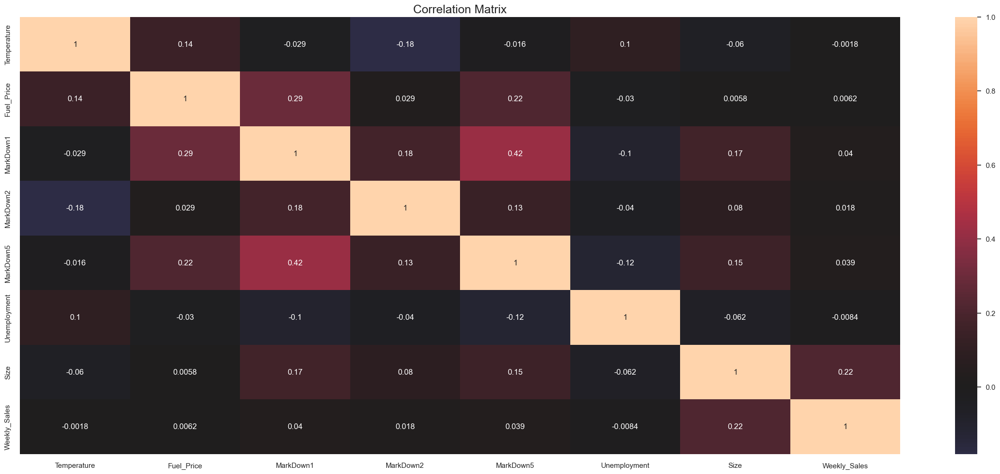

In [47]:
plt.figure(figsize=(30,12))
sns.set(style = "white")
corr = dfcorrelation.corr()
mask = np.triu(np.ones_like(corr, dtype=np.bool))
# f, ax = plt.subplots(figsize=(20, 15))
cmap = sns.diverging_palette(220, 10, as_cmap=True)
plt.title('Correlation Matrix', fontsize=18)
sns.heatmap(corr, annot = True, center=0)
plt.show()

# Preparation

In [48]:
prediction_df= dfcorrelation.copy()
prediction_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 385981 entries, 0 to 421569
Data columns (total 12 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   Store         385981 non-null  object        
 1   Date_tranx    385981 non-null  datetime64[ns]
 2   Temperature   385981 non-null  float64       
 3   Fuel_Price    385981 non-null  float64       
 4   MarkDown1     385981 non-null  float64       
 5   MarkDown2     385981 non-null  float64       
 6   MarkDown5     385981 non-null  float64       
 7   Unemployment  385981 non-null  float64       
 8   Type          385981 non-null  object        
 9   Size          385981 non-null  int64         
 10  Dept          385981 non-null  object        
 11  Weekly_Sales  385981 non-null  float64       
dtypes: datetime64[ns](1), float64(7), int64(1), object(3)
memory usage: 38.3+ MB


In [49]:
prediction_df['weekly'] = pd.to_datetime(prediction_df['Date_tranx']) - pd.to_timedelta(7, unit='d')
prediction_df

,Store,Date_tranx,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown5,Unemployment,Type,Size,Dept,Weekly_Sales,weekly
0,1,2010-05-02,42.31,2.572,0.00,0.00,0.00,8.106,A,151315,1,24924.50,2010-04-25
2,1,2010-05-02,42.31,2.572,0.00,0.00,0.00,8.106,A,151315,3,13740.12,2010-04-25
3,1,2010-05-02,42.31,2.572,0.00,0.00,0.00,8.106,A,151315,4,39954.04,2010-04-25
4,1,2010-05-02,42.31,2.572,0.00,0.00,0.00,8.106,A,151315,5,32229.38,2010-04-25
5,1,2010-05-02,42.31,2.572,0.00,0.00,0.00,8.106,A,151315,6,5749.03,2010-04-25
...,...,...,...,...,...,...,...,...,...,...,...,...,...
421563,45,2012-10-26,58.85,3.882,4018.91,58.08,858.33,8.667,B,118221,91,16330.84,2012-10-19
421565,45,2012-10-26,58.85,3.882,4018.91,58.08,858.33,8.667,B,118221,93,2487.80,2012-10-19
421566,45,2012-10-26,58.85,3.882,4018.91,58.08,858.33,8.667,B,118221,94,5203.31,2012-10-19
421568,45,2012-10-26,58.85,3.882,4018.91,58.08,858.33,8.667,B,118221,97,6817.48,2012-10-19


In [50]:
prediction_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 385981 entries, 0 to 421569
Data columns (total 13 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   Store         385981 non-null  object        
 1   Date_tranx    385981 non-null  datetime64[ns]
 2   Temperature   385981 non-null  float64       
 3   Fuel_Price    385981 non-null  float64       
 4   MarkDown1     385981 non-null  float64       
 5   MarkDown2     385981 non-null  float64       
 6   MarkDown5     385981 non-null  float64       
 7   Unemployment  385981 non-null  float64       
 8   Type          385981 non-null  object        
 9   Size          385981 non-null  int64         
 10  Dept          385981 non-null  object        
 11  Weekly_Sales  385981 non-null  float64       
 12  weekly        385981 non-null  datetime64[ns]
dtypes: datetime64[ns](2), float64(7), int64(1), object(3)
memory usage: 41.2+ MB


## Grouping

### By Store and Dept

In [51]:
perweek = prediction_df.groupby(['Store','Dept', pd.Grouper(key='weekly', freq='W-MON')])['Weekly_Sales'].sum().reset_index().sort_values(['Store','Dept','weekly'])
perweek

,Store,Dept,weekly,Weekly_Sales
0,1,1,2010-01-04,20094.19
1,1,1,2010-02-01,16333.14
2,1,1,2010-02-15,41595.55
3,1,1,2010-02-22,19403.54
4,1,1,2010-03-08,38759.34
...,...,...,...,...
341901,9,98,2011-12-12,66.75
341902,9,98,2011-12-19,25.50
341903,9,98,2012-01-23,-1.00
341904,9,98,2012-05-14,6.00


In [52]:
perweek.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 341906 entries, 0 to 341905
Data columns (total 4 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   Store         341906 non-null  object        
 1   Dept          341906 non-null  object        
 2   weekly        341906 non-null  datetime64[ns]
 3   Weekly_Sales  341906 non-null  float64       
dtypes: datetime64[ns](1), float64(1), object(2)
memory usage: 13.0+ MB


### overall trend

In [53]:
overall= ['weekly', 'Weekly_Sales']
overall_trend= prediction_df[overall]
overall_trend=overall_trend.groupby([pd.Grouper(key='weekly', freq='W-MON')])['Weekly_Sales'].sum().reset_index().sort_values(['weekly'])
overall_trend

,weekly,Weekly_Sales
0,2010-01-04,27269473.62
1,2010-01-11,0.00
2,2010-01-18,0.00
3,2010-01-25,0.00
4,2010-02-01,58997613.58
...,...,...
148,2012-11-05,0.00
149,2012-11-12,0.00
150,2012-11-19,0.00
151,2012-11-26,0.00


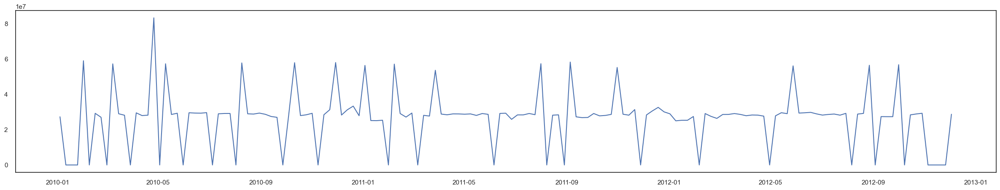

In [54]:
plt.figure(figsize=(30,5))
plt.plot(overall_trend['weekly'], overall_trend['Weekly_Sales'])
plt.show()

### Store

In [55]:
store= ['Store','weekly', 'Weekly_Sales']
store_= prediction_df[store]
store_=store_.groupby(['Store',pd.Grouper(key='weekly', freq='W-MON')])['Weekly_Sales'].sum().reset_index().sort_values(['Store','weekly'])
store_

,Store,weekly,Weekly_Sales
0,1,2010-01-04,806070.77
1,1,2010-02-01,1590213.94
2,1,2010-02-15,807503.79
3,1,2010-02-22,726167.58
4,1,2010-03-08,1547934.15
...,...,...,...
5665,9,2012-10-01,931147.38
5666,9,2012-10-15,475629.33
5667,9,2012-10-22,487345.99
5668,9,2012-10-29,489538.63


In [56]:
grouped = store_.groupby(store_['Store'])
store1 = grouped.get_group('1')
store2= grouped.get_group('2')
store3= grouped.get_group('3')
store4= grouped.get_group('4')
store5= grouped.get_group('5')
store6= grouped.get_group('6')
store7= grouped.get_group('7')
store8= grouped.get_group('8')
store9= grouped.get_group('9')
store10= grouped.get_group('10')
store11= grouped.get_group('11')
store12= grouped.get_group('12')
store13= grouped.get_group('13')
store14= grouped.get_group('14')
store15= grouped.get_group('15')
store16= grouped.get_group('16')
store17= grouped.get_group('17')
store18= grouped.get_group('18')
store19= grouped.get_group('19')
store20= grouped.get_group('20')
store21= grouped.get_group('21')
store22= grouped.get_group('22')
store23= grouped.get_group('23')
store24= grouped.get_group('24')
store25= grouped.get_group('25')
store26= grouped.get_group('26')
store27= grouped.get_group('27')
store28= grouped.get_group('28')
store29= grouped.get_group('29')
store30= grouped.get_group('30')
store31= grouped.get_group('31')
store32= grouped.get_group('32')
store33= grouped.get_group('33')
store34= grouped.get_group('34')
store35= grouped.get_group('35')
store36= grouped.get_group('36')
store37= grouped.get_group('37')
store38= grouped.get_group('38')
store39= grouped.get_group('39')
store40= grouped.get_group('40')
store41= grouped.get_group('41')
store42= grouped.get_group('42')
store43= grouped.get_group('43')
store44= grouped.get_group('44')
store45= grouped.get_group('45')


In [57]:
store45

,Store,weekly,Weekly_Sales
4914,45,2010-01-04,635010.81
4915,45,2010-02-01,1401962.45
4916,45,2010-02-15,678882.32
4917,45,2010-02-22,589161.19
4918,45,2010-03-08,1391536.79
...,...,...,...
5035,45,2012-10-01,1159641.54
5036,45,2012-10-15,567154.54
5037,45,2012-10-22,601856.14
5038,45,2012-10-29,612627.01


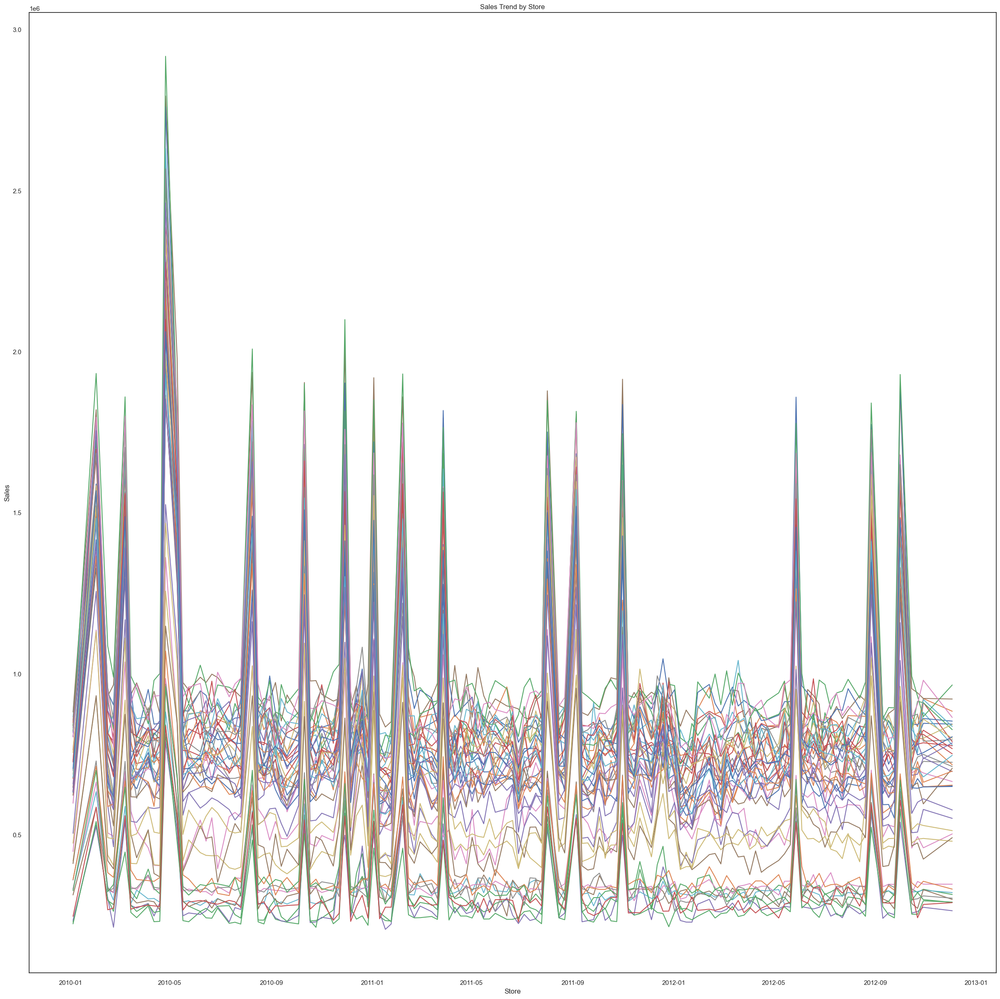

In [58]:
#Size
plt.figure(figsize=(30,30))

#graph
plt.plot(store1['weekly'], store1['Weekly_Sales'], label = "Store 1")
plt.plot(store2['weekly'], store2['Weekly_Sales'], label = "Store 2")
plt.plot(store3['weekly'], store3['Weekly_Sales'], label = "Store 3")
plt.plot(store4['weekly'], store4['Weekly_Sales'], label = "Store 4")
plt.plot(store5['weekly'], store5['Weekly_Sales'], label = "Store 5")
plt.plot(store6['weekly'], store6['Weekly_Sales'], label = "Store 6")
plt.plot(store7['weekly'], store7['Weekly_Sales'], label = "Store 7")
plt.plot(store8['weekly'], store8['Weekly_Sales'], label = "Store 8")
plt.plot(store9['weekly'], store9['Weekly_Sales'], label = "Store 9")
plt.plot(store10['weekly'], store10['Weekly_Sales'], label = "Store 10")
plt.plot(store11['weekly'], store11['Weekly_Sales'], label = "Store 11")
plt.plot(store12['weekly'], store12['Weekly_Sales'], label = "Store 12")
plt.plot(store13['weekly'], store13['Weekly_Sales'], label = "Store 13")
plt.plot(store14['weekly'], store14['Weekly_Sales'], label = "Store 14")
plt.plot(store15['weekly'], store15['Weekly_Sales'], label = "Store 15")
plt.plot(store16['weekly'], store16['Weekly_Sales'], label = "Store 16")
plt.plot(store17['weekly'], store17['Weekly_Sales'], label = "Store 17")
plt.plot(store18['weekly'], store18['Weekly_Sales'], label = "Store 18")
plt.plot(store19['weekly'], store19['Weekly_Sales'], label = "Store 19")
plt.plot(store20['weekly'], store20['Weekly_Sales'], label = "Store 20")
plt.plot(store21['weekly'], store21['Weekly_Sales'], label = "Store 21")
plt.plot(store22['weekly'], store22['Weekly_Sales'], label = "Store 22")
plt.plot(store23['weekly'], store23['Weekly_Sales'], label = "Store 23")
plt.plot(store24['weekly'], store24['Weekly_Sales'], label = "Store 24")
plt.plot(store25['weekly'], store25['Weekly_Sales'], label = "Store 25")
plt.plot(store26['weekly'], store26['Weekly_Sales'], label = "Store 26")
plt.plot(store27['weekly'], store27['Weekly_Sales'], label = "Store 27")
plt.plot(store28['weekly'], store28['Weekly_Sales'], label = "Store 28")
plt.plot(store29['weekly'], store29['Weekly_Sales'], label = "Store 29")
plt.plot(store30['weekly'], store30['Weekly_Sales'], label = "Store 30")
plt.plot(store31['weekly'], store31['Weekly_Sales'], label = "Store 31")
plt.plot(store32['weekly'], store32['Weekly_Sales'], label = "Store 32")
plt.plot(store33['weekly'], store33['Weekly_Sales'], label = "Store 33")
plt.plot(store34['weekly'], store34['Weekly_Sales'], label = "Store 34")
plt.plot(store35['weekly'], store35['Weekly_Sales'], label = "Store 35")
plt.plot(store36['weekly'], store36['Weekly_Sales'], label = "Store 36")
plt.plot(store37['weekly'], store37['Weekly_Sales'], label = "Store 37")
plt.plot(store38['weekly'], store38['Weekly_Sales'], label = "Store 38")
plt.plot(store39['weekly'], store39['Weekly_Sales'], label = "Store 39")
plt.plot(store40['weekly'], store40['Weekly_Sales'], label = "Store 40")
plt.plot(store41['weekly'], store41['Weekly_Sales'], label = "Store 41")
plt.plot(store42['weekly'], store42['Weekly_Sales'], label = "Store 42")
plt.plot(store43['weekly'], store43['Weekly_Sales'], label = "Store 43")
plt.plot(store44['weekly'], store44['Weekly_Sales'], label = "Store 44")
plt.plot(store45['weekly'], store45['Weekly_Sales'], label = "Store 45")


# naming the x axis
plt.xlabel('Store')
# naming the y axis
plt.ylabel('Sales')
# giving a title to my graph
plt.title('Sales Trend by Store')
  
# function to show the plot
plt.show()


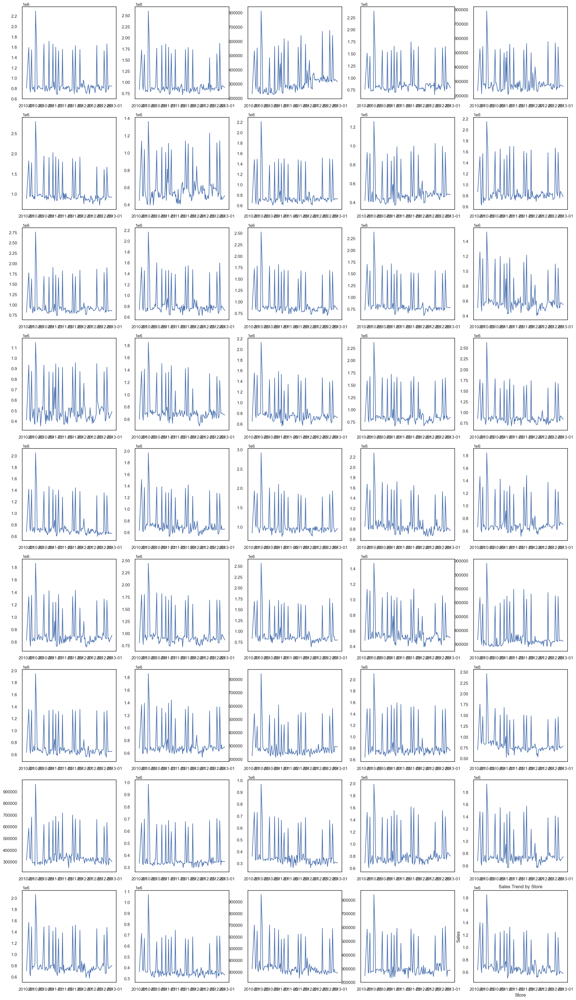

In [59]:
#Size
plt.rcParams["figure.figsize"] = [25,45]

#graph
plt.subplot(9,5,1)
plt.plot(store1['weekly'], store1['Weekly_Sales'], label = "Store 1")
plt.subplot(9,5,2)
plt.plot(store2['weekly'], store2['Weekly_Sales'], label = "Store 2")
plt.subplot(9,5,3)
plt.plot(store3['weekly'], store3['Weekly_Sales'], label = "Store 3")
plt.subplot(9,5,4)
plt.plot(store4['weekly'], store4['Weekly_Sales'], label = "Store 4")
plt.subplot(9,5,5)
plt.plot(store5['weekly'], store5['Weekly_Sales'], label = "Store 5")
plt.subplot(9,5,6)
plt.plot(store6['weekly'], store6['Weekly_Sales'], label = "Store 6")
plt.subplot(9,5,7)
plt.plot(store7['weekly'], store7['Weekly_Sales'], label = "Store 7")
plt.subplot(9,5,8)
plt.plot(store8['weekly'], store8['Weekly_Sales'], label = "Store 8")
plt.subplot(9,5,9)
plt.plot(store9['weekly'], store9['Weekly_Sales'], label = "Store 9")
plt.subplot(9,5,10)
plt.plot(store10['weekly'], store10['Weekly_Sales'], label = "Store 10")
plt.subplot(9,5,11)
plt.plot(store11['weekly'], store11['Weekly_Sales'], label = "Store 11")
plt.subplot(9,5,12)
plt.plot(store12['weekly'], store12['Weekly_Sales'], label = "Store 12")
plt.subplot(9,5,13)
plt.plot(store13['weekly'], store13['Weekly_Sales'], label = "Store 13")
plt.subplot(9,5,14)
plt.plot(store14['weekly'], store14['Weekly_Sales'], label = "Store 14")
plt.subplot(9,5,15)
plt.plot(store15['weekly'], store15['Weekly_Sales'], label = "Store 15")
plt.subplot(9,5,16)
plt.plot(store16['weekly'], store16['Weekly_Sales'], label = "Store 16")
plt.subplot(9,5,17)
plt.plot(store17['weekly'], store17['Weekly_Sales'], label = "Store 17")
plt.subplot(9,5,18)
plt.plot(store18['weekly'], store18['Weekly_Sales'], label = "Store 18")
plt.subplot(9,5,19)
plt.plot(store19['weekly'], store19['Weekly_Sales'], label = "Store 19")
plt.subplot(9,5,20)
plt.plot(store20['weekly'], store20['Weekly_Sales'], label = "Store 20")
plt.subplot(9,5,21)
plt.plot(store21['weekly'], store21['Weekly_Sales'], label = "Store 21")
plt.subplot(9,5,22)
plt.plot(store22['weekly'], store22['Weekly_Sales'], label = "Store 22")
plt.subplot(9,5,23)
plt.plot(store23['weekly'], store23['Weekly_Sales'], label = "Store 23")
plt.subplot(9,5,24)
plt.plot(store24['weekly'], store24['Weekly_Sales'], label = "Store 24")
plt.subplot(9,5,25)
plt.plot(store25['weekly'], store25['Weekly_Sales'], label = "Store 25")
plt.subplot(9,5,26)
plt.plot(store26['weekly'], store26['Weekly_Sales'], label = "Store 26")
plt.subplot(9,5,27)
plt.plot(store27['weekly'], store27['Weekly_Sales'], label = "Store 27")
plt.subplot(9,5,28)
plt.plot(store28['weekly'], store28['Weekly_Sales'], label = "Store 28")
plt.subplot(9,5,29)
plt.plot(store29['weekly'], store29['Weekly_Sales'], label = "Store 29")
plt.subplot(9,5,30)
plt.plot(store30['weekly'], store30['Weekly_Sales'], label = "Store 30")
plt.subplot(9,5,31)
plt.plot(store31['weekly'], store31['Weekly_Sales'], label = "Store 31")
plt.subplot(9,5,32)
plt.plot(store32['weekly'], store32['Weekly_Sales'], label = "Store 32")
plt.subplot(9,5,33)
plt.plot(store33['weekly'], store33['Weekly_Sales'], label = "Store 33")
plt.subplot(9,5,34)
plt.plot(store34['weekly'], store34['Weekly_Sales'], label = "Store 34")
plt.subplot(9,5,35)
plt.plot(store35['weekly'], store35['Weekly_Sales'], label = "Store 35")
plt.subplot(9,5,36)
plt.plot(store36['weekly'], store36['Weekly_Sales'], label = "Store 36")
plt.subplot(9,5,37)
plt.plot(store37['weekly'], store37['Weekly_Sales'], label = "Store 37")
plt.subplot(9,5,38)
plt.plot(store38['weekly'], store38['Weekly_Sales'], label = "Store 38")
plt.subplot(9,5,39)
plt.plot(store39['weekly'], store39['Weekly_Sales'], label = "Store 39")
plt.subplot(9,5,40)
plt.plot(store40['weekly'], store40['Weekly_Sales'], label = "Store 40")
plt.subplot(9,5,41)
plt.plot(store41['weekly'], store41['Weekly_Sales'], label = "Store 41")
plt.subplot(9,5,42)
plt.plot(store42['weekly'], store42['Weekly_Sales'], label = "Store 42")
plt.subplot(9,5,43)
plt.plot(store43['weekly'], store43['Weekly_Sales'], label = "Store 43")
plt.subplot(9,5,44)
plt.plot(store44['weekly'], store44['Weekly_Sales'], label = "Store 44")
plt.subplot(9,5,45)
plt.plot(store45['weekly'], store45['Weekly_Sales'], label = "Store 45")


# naming the x axis
plt.xlabel('Store')
# naming the y axis
plt.ylabel('Sales')
# giving a title to my graph
plt.title('Sales Trend by Store')
  
# function to show the plot
plt.show()


All Store have similar trend and peak sales

# mean and standar deviation, seasonal & residual

## Overall

In [60]:
overall_trend.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 153 entries, 0 to 152
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   weekly        153 non-null    datetime64[ns]
 1   Weekly_Sales  153 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 3.6 KB


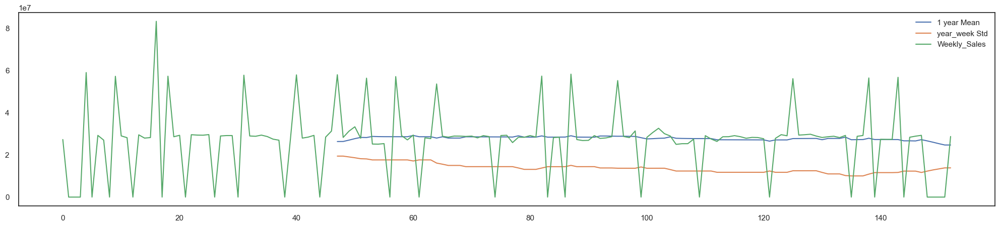

In [61]:
#mean and standar deviation
timeseries1 = overall_trend ['Weekly_Sales']

plt.rcParams["figure.figsize"] = [25,5]

timeseries1.rolling(48).mean().plot(label='1 year Mean')
timeseries1.rolling(48).std().plot(label='year_week Std')
timeseries1.plot()
plt.legend()
plt.show()

In [62]:
overall_trend1 = overall_trend.set_index('weekly')
overall_trend1.sort_index(inplace=True)
overall_trend1

,Weekly_Sales
weekly,
2010-01-04,27269473.62
2010-01-11,0.00
2010-01-18,0.00
2010-01-25,0.00
2010-02-01,58997613.58
...,...
2012-11-05,0.00
2012-11-12,0.00
2012-11-19,0.00


<Figure size 2500x500 with 0 Axes>

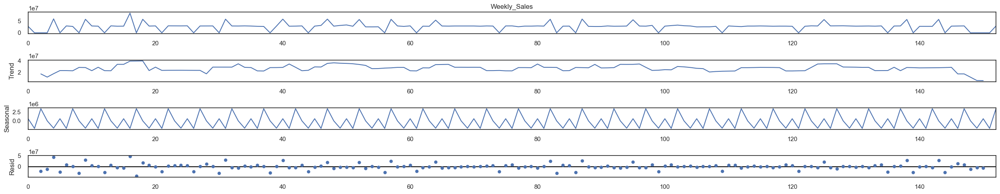

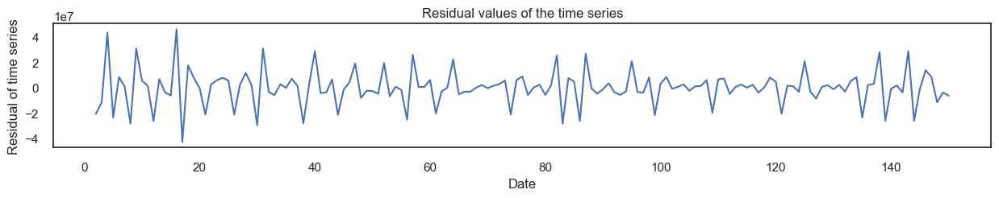

In [63]:
#seasonal & residual
from statsmodels.tsa.seasonal import seasonal_decompose

decomposition = seasonal_decompose(overall_trend['Weekly_Sales'],model= 'additive', period=5)
 
plt.figure()  
decomposition.plot()  
plt.show()

decomposition_residual1=decomposition.resid
ax1= decomposition_residual1.plot(figsize=(15,2))
ax1.set_xlabel('Date')
ax1.set_ylabel('Residual of time series')
ax1.set_title('Residual values of the time series')
plt.show()

## Store

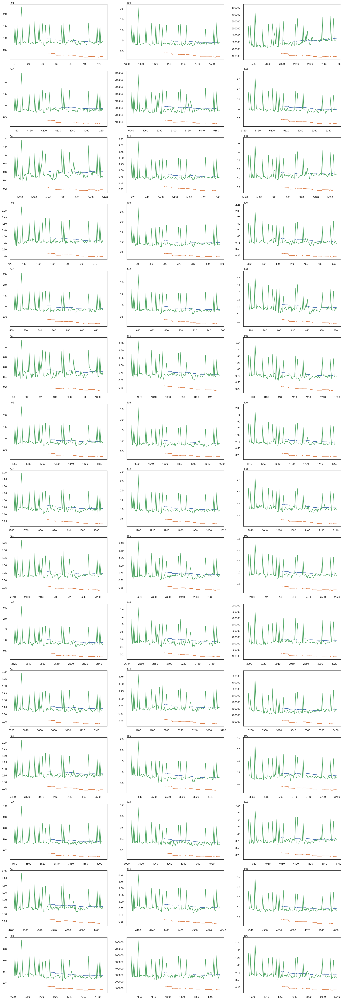

In [64]:
#mean and standar deviation
plt.rcParams["figure.figsize"] = [25,75]

#store 1
plt.subplot(15,3,1)
store1['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store1['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store1['Weekly_Sales'].plot()

#store 2
plt.subplot(15,3,2)
store2['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store2['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store2['Weekly_Sales'].plot()

#store 3
plt.subplot(15,3,3)
store3['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store3['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store3['Weekly_Sales'].plot()

#store 4
plt.subplot(15,3,4)
store4['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store4['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store4['Weekly_Sales'].plot()

#store 5
plt.subplot(15,3,5)
store5['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store5['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store5['Weekly_Sales'].plot()

#store 6
plt.subplot(15,3,6)
store6['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store6['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store6['Weekly_Sales'].plot()

#store 7
plt.subplot(15,3,7)
store7['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store7['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store7['Weekly_Sales'].plot()

#store 8
plt.subplot(15,3,8)
store8['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store8['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store8['Weekly_Sales'].plot()

#store 9
plt.subplot(15,3,9)
store9['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store9['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store9['Weekly_Sales'].plot()

#store 10
plt.subplot(15,3,10)
store10['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store10['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store10['Weekly_Sales'].plot()

#store 11
plt.subplot(15,3,11)
store11['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store11['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store11['Weekly_Sales'].plot()

#store 12
plt.subplot(15,3,12)
store12['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store12['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store12['Weekly_Sales'].plot()

#store 13
plt.subplot(15,3,13)
store13['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store13['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store13['Weekly_Sales'].plot()

#store 14
plt.subplot(15,3,14)
store14['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store14['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store14['Weekly_Sales'].plot()

#store 15
plt.subplot(15,3,15)
store15['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store15['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store15['Weekly_Sales'].plot()

#store 16
plt.subplot(15,3,16)
store16['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store16['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store16['Weekly_Sales'].plot()

#store 17
plt.subplot(15,3,17)
store17['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store17['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store17['Weekly_Sales'].plot()

#store 18
plt.subplot(15,3,18)
store18['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store18['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store18['Weekly_Sales'].plot()

#store 19
plt.subplot(15,3,19)
store19['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store19['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store19['Weekly_Sales'].plot()

#store 20
plt.subplot(15,3,20)
store20['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store20['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store20['Weekly_Sales'].plot()

#store 21
plt.subplot(15,3,21)
store21['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store21['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store21['Weekly_Sales'].plot()

#store 22
plt.subplot(15,3,22)
store22['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store22['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store22['Weekly_Sales'].plot()

#store 23
plt.subplot(15,3,23)
store23['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store23['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store23['Weekly_Sales'].plot()

#store 24
plt.subplot(15,3,24)
store24['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store24['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store24['Weekly_Sales'].plot()

#store 25
plt.subplot(15,3,25)
store25['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store25['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store25['Weekly_Sales'].plot()

#store 26
plt.subplot(15,3,26)
store26['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store26['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store26['Weekly_Sales'].plot()

#store 27
plt.subplot(15,3,27)
store27['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store27['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store27['Weekly_Sales'].plot()

#store 28
plt.subplot(15,3,28)
store28['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store28['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store28['Weekly_Sales'].plot()

#store 29
plt.subplot(15,3,29)
store29['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store29['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store29['Weekly_Sales'].plot()

#store 30
plt.subplot(15,3,30)
store30['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store30['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store30['Weekly_Sales'].plot()

#store 31
plt.subplot(15,3,31)
store31['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store31['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store31['Weekly_Sales'].plot()

#store 32
plt.subplot(15,3,32)
store32['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store32['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store32['Weekly_Sales'].plot()

#store 33
plt.subplot(15,3,33)
store33['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store33['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store33['Weekly_Sales'].plot()

#store 34
plt.subplot(15,3,34)
store34['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store34['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store34['Weekly_Sales'].plot()

#store 35
plt.subplot(15,3,35)
store35['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store35['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store35['Weekly_Sales'].plot()

#store 36
plt.subplot(15,3,36)
store36['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store36['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store36['Weekly_Sales'].plot()

#store 37
plt.subplot(15,3,37)
store37['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store37['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store37['Weekly_Sales'].plot()

#store 38
plt.subplot(15,3,38)
store38['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store38['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store38['Weekly_Sales'].plot()

#store 39
plt.subplot(15,3,39)
store39['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store39['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store39['Weekly_Sales'].plot()

#store 40
plt.subplot(15,3,40)
store40['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store40['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store40['Weekly_Sales'].plot()

#store 41
plt.subplot(15,3,41)
store41['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store41['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store41['Weekly_Sales'].plot()

#store 42
plt.subplot(15,3,42)
store42['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store42['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store42['Weekly_Sales'].plot()

#store 43
plt.subplot(15,3,43)
store43['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store43['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store43['Weekly_Sales'].plot()

#store 44
plt.subplot(15,3,44)
store44['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store44['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store44['Weekly_Sales'].plot()

#store 45
plt.subplot(15,3,45)
store45['Weekly_Sales'].rolling(48).mean().plot(label='1 year Mean')
store45['Weekly_Sales'].rolling(48).std().plot(label='year_week Std')
store45['Weekly_Sales'].plot()

plt.show()

In [65]:
#Mean
store_['Weekly_Sales'].mean()

717840.245005291

In [66]:
mean1= store1['Weekly_Sales'].mean()
mean2= store2['Weekly_Sales'].mean()
mean3= store3['Weekly_Sales'].mean()
mean4= store4['Weekly_Sales'].mean()
mean5= store5['Weekly_Sales'].mean()
mean6= store6['Weekly_Sales'].mean()
mean7= store7['Weekly_Sales'].mean()
mean8= store8['Weekly_Sales'].mean()
mean9= store9['Weekly_Sales'].mean()
mean10= store10['Weekly_Sales'].mean()
mean11= store11['Weekly_Sales'].mean()
mean12= store12['Weekly_Sales'].mean()
mean13= store13['Weekly_Sales'].mean()
mean14= store14['Weekly_Sales'].mean()
mean15= store15['Weekly_Sales'].mean()
mean16= store16['Weekly_Sales'].mean()
mean17= store17['Weekly_Sales'].mean()
mean18= store18['Weekly_Sales'].mean()
mean19= store19['Weekly_Sales'].mean()
mean20= store20['Weekly_Sales'].mean()
mean21= store21['Weekly_Sales'].mean()
mean22= store22['Weekly_Sales'].mean()
mean23= store23['Weekly_Sales'].mean()
mean24= store24['Weekly_Sales'].mean()
mean25= store25['Weekly_Sales'].mean()
mean26= store26['Weekly_Sales'].mean()
mean27= store27['Weekly_Sales'].mean()
mean28= store28['Weekly_Sales'].mean()
mean29= store29['Weekly_Sales'].mean()
mean30= store30['Weekly_Sales'].mean()
mean31= store31['Weekly_Sales'].mean()
mean32= store32['Weekly_Sales'].mean()
mean33= store33['Weekly_Sales'].mean()
mean34= store34['Weekly_Sales'].mean()
mean35= store35['Weekly_Sales'].mean()
mean36= store36['Weekly_Sales'].mean()
mean37= store37['Weekly_Sales'].mean()
mean38= store38['Weekly_Sales'].mean()
mean39= store39['Weekly_Sales'].mean()
mean40= store40['Weekly_Sales'].mean()
mean41= store41['Weekly_Sales'].mean()
mean42= store42['Weekly_Sales'].mean()
mean43= store43['Weekly_Sales'].mean()
mean44= store44['Weekly_Sales'].mean()
mean45= store45['Weekly_Sales'].mean()


In [67]:
#Standar Deviation
store_['Weekly_Sales'].std()

338970.97508839145

In [68]:
std1= store1['Weekly_Sales'].std()
std2= store2['Weekly_Sales'].std()
std3= store3['Weekly_Sales'].std()
std4= store4['Weekly_Sales'].std()
std5= store5['Weekly_Sales'].std()
std6= store6['Weekly_Sales'].std()
std7= store7['Weekly_Sales'].std()
std8= store8['Weekly_Sales'].std()
std9= store9['Weekly_Sales'].std()
std10= store10['Weekly_Sales'].std()
std11= store11['Weekly_Sales'].std()
std12= store12['Weekly_Sales'].std()
std13= store13['Weekly_Sales'].std()
std14= store14['Weekly_Sales'].std()
std15= store15['Weekly_Sales'].std()
std16= store16['Weekly_Sales'].std()
std17= store17['Weekly_Sales'].std()
std18= store18['Weekly_Sales'].std()
std19= store19['Weekly_Sales'].std()
std20= store20['Weekly_Sales'].std()
std21= store21['Weekly_Sales'].std()
std22= store22['Weekly_Sales'].std()
std23= store23['Weekly_Sales'].std()
std24= store24['Weekly_Sales'].std()
std25= store25['Weekly_Sales'].std()
std26= store26['Weekly_Sales'].std()
std27= store27['Weekly_Sales'].std()
std28= store28['Weekly_Sales'].std()
std29= store29['Weekly_Sales'].std()
std30= store30['Weekly_Sales'].std()
std31= store31['Weekly_Sales'].std()
std32= store32['Weekly_Sales'].std()
std33= store33['Weekly_Sales'].std()
std34= store34['Weekly_Sales'].std()
std35= store35['Weekly_Sales'].std()
std36= store36['Weekly_Sales'].std()
std37= store37['Weekly_Sales'].std()
std38= store38['Weekly_Sales'].std()
std39= store39['Weekly_Sales'].std()
std40= store40['Weekly_Sales'].std()
std41= store41['Weekly_Sales'].std()
std42= store42['Weekly_Sales'].std()
std43= store43['Weekly_Sales'].std()
std44= store44['Weekly_Sales'].std()
std45= store45['Weekly_Sales'].std()


In [69]:
#SUM
sum1= store1['Weekly_Sales'].sum()
sum2= store2['Weekly_Sales'].sum()
sum3= store3['Weekly_Sales'].sum()
sum4= store4['Weekly_Sales'].sum()
sum5= store5['Weekly_Sales'].sum()
sum6= store6['Weekly_Sales'].sum()
sum7= store7['Weekly_Sales'].sum()
sum8= store8['Weekly_Sales'].sum()
sum9= store9['Weekly_Sales'].sum()
sum10= store10['Weekly_Sales'].sum()
sum11= store11['Weekly_Sales'].sum()
sum12= store12['Weekly_Sales'].sum()
sum13= store13['Weekly_Sales'].sum()
sum14= store14['Weekly_Sales'].sum()
sum15= store15['Weekly_Sales'].sum()
sum16= store16['Weekly_Sales'].sum()
sum17= store17['Weekly_Sales'].sum()
sum18= store18['Weekly_Sales'].sum()
sum19= store19['Weekly_Sales'].sum()
sum20= store20['Weekly_Sales'].sum()
sum21= store21['Weekly_Sales'].sum()
sum22= store22['Weekly_Sales'].sum()
sum23= store23['Weekly_Sales'].sum()
sum24= store24['Weekly_Sales'].sum()
sum25= store25['Weekly_Sales'].sum()
sum26= store26['Weekly_Sales'].sum()
sum27= store27['Weekly_Sales'].sum()
sum28= store28['Weekly_Sales'].sum()
sum29= store29['Weekly_Sales'].sum()
sum30= store30['Weekly_Sales'].sum()
sum31= store31['Weekly_Sales'].sum()
sum32= store32['Weekly_Sales'].sum()
sum33= store33['Weekly_Sales'].sum()
sum34= store34['Weekly_Sales'].sum()
sum35= store35['Weekly_Sales'].sum()
sum36= store36['Weekly_Sales'].sum()
sum37= store37['Weekly_Sales'].sum()
sum38= store38['Weekly_Sales'].sum()
sum39= store39['Weekly_Sales'].sum()
sum40= store40['Weekly_Sales'].sum()
sum41= store41['Weekly_Sales'].sum()
sum42= store42['Weekly_Sales'].sum()
sum43= store43['Weekly_Sales'].sum()
sum44= store44['Weekly_Sales'].sum()
sum45= store45['Weekly_Sales'].sum()


In [70]:
d_store= [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45]
n_store=pd.DataFrame(d_store, columns=['Name_Store'])
n_store

,Name_Store
0,1
1,2
2,3
3,4
4,5
5,6
6,7
7,8
8,9
9,10


In [71]:
sum_df=np.array([sum1,sum2,sum3,sum4,sum5,sum6,sum7,sum8,sum9,sum10,sum11,sum12,sum13,sum14,sum15,sum16,sum17,sum18,sum19,sum20,sum21,sum22,sum23,sum24,sum25,sum26,sum27,sum28,sum29,sum30,sum31,sum32,sum33,sum34,sum35,sum36,sum37,sum38,sum39,sum40,sum41,sum42,sum43,sum44,sum45])
sum_df

array([1.14489115e+08, 1.21447138e+08, 4.17678469e+07, 1.14147430e+08,
       3.83604877e+07, 1.30391548e+08, 7.58364718e+07, 1.01713785e+08,
       6.53999655e+07, 1.13515755e+08, 1.25434492e+08, 1.07939691e+08,
       1.19879005e+08, 1.10186490e+08, 7.86782699e+07, 6.56722442e+07,
       9.52850049e+07, 1.03587238e+08, 1.16415382e+08, 1.18784012e+08,
       9.88963020e+07, 9.52383155e+07, 1.32962388e+08, 1.15092390e+08,
       9.40133096e+07, 9.25042186e+07, 1.24943933e+08, 1.18924333e+08,
       7.36959887e+07, 4.50967279e+07, 9.37631017e+07, 9.49351374e+07,
       3.69182602e+07, 1.06825710e+08, 1.08013633e+08, 4.54225506e+07,
       4.80276239e+07, 4.66596448e+07, 1.06350112e+08, 1.01115912e+08,
       1.05514255e+08, 4.94722897e+07, 4.57114308e+07, 4.03546187e+07,
       9.07706315e+07])

In [72]:
n_store['SUM']=sum_df

In [73]:
mean_df=np.array([mean1,mean2,mean3,mean4,mean5,mean6,mean7,mean8,mean9,mean10,mean11,mean12,mean13,mean14,mean15,mean16,mean17,mean18,mean19,mean20,mean21,mean22,mean23,mean24,mean25,mean26,mean27,mean28,mean29,mean30,mean31,mean32,mean33,mean34,mean35,mean36,mean37,mean38,mean39,mean40,mean41,mean42,mean43,mean44,mean45])
mean_df

array([ 908643.7718254 ,  963866.17634921,  331490.8481746 ,
        905931.98460317,  304448.31484127, 1034853.55642857,
        601876.76039683,  807252.26174603,  519047.34531746,
        900918.69396825,  995511.84246032,  856664.21380952,
        951420.67587302,  874495.95547619,  624430.7131746 ,
        521208.28746032,  756230.19793651,  822120.93801587,
        923931.60380952,  942730.25642857,  784891.28539683,
        755859.64650794, 1055257.04428571,  913431.6652381 ,
        746137.37801587,  734160.4647619 ,  991618.51507937,
        943843.90968254,  584888.79920635,  357910.53888889,
        744151.60103175,  753453.47126984,  293002.06492063,
        847823.0918254 ,  857251.05246032,  360496.43301587,
        381171.61793651,  370314.64119048,  844048.50404762,
        802507.2384127 ,  837414.72134921,  392637.21992063,
        362789.13333333,  320274.75174603,  720401.83761905])

In [74]:
n_store['Mean']=mean_df

In [75]:
std_df= np.array([std1,std2,std3,std4,std5,std6,std7,std8,std9,std10,std11,std12,std13,std14,std15,std16,std17,std18,std19,std20,std21,std22,std23,std24,std25,std26,std27,std28,std29,std30,std31,std32,std33,std34,std35,std36,std37,std38,std39,std40,std41,std42,std43,std44,std45])
std_df

array([292624.72209729, 329727.20996485, 114653.88974886, 293400.23155785,
       102748.71319553, 347211.6634443 , 199272.29294721, 280125.57562303,
       171568.60420774, 289614.69443244, 335171.77460874, 270227.7959996 ,
       316481.53468589, 300150.513388  , 211583.16403731, 166631.70241769,
       248280.14981493, 272362.2557085 , 298606.25123331, 318877.94736178,
       255305.67400321, 249871.3061619 , 356469.72541948, 284184.73758745,
       240675.62606031, 243373.31950306, 314244.17905528, 311481.34029618,
       195139.48995294, 116161.06071837, 245807.56735895, 239256.94566847,
       101622.39141266, 274549.91554261, 301269.12569517, 124185.58782317,
       121091.22376418, 124207.4082215 , 267891.44606666, 260823.78333434,
       263905.23273469, 125537.93184358, 121513.1477494 , 104580.74453624,
       232860.78359433])

In [76]:
n_store['STD']=std_df

In [77]:
n_store.sort_values(['SUM'])

,Name_Store,SUM,Mean,STD
32,33,3.691826e+07,2.930021e+05,101622.391413
4,5,3.836049e+07,3.044483e+05,102748.713196
43,44,4.035462e+07,3.202748e+05,104580.744536
2,3,4.176785e+07,3.314908e+05,114653.889749
29,30,4.509673e+07,3.579105e+05,116161.060718
35,36,4.542255e+07,3.604964e+05,124185.587823
42,43,4.571143e+07,3.627891e+05,121513.147749
37,38,4.665964e+07,3.703146e+05,124207.408221
36,37,4.802762e+07,3.811716e+05,121091.223764
41,42,4.947229e+07,3.926372e+05,125537.931844


extract top 10 store to continue next step

#### Store 33

In [78]:
store33_ = store33.set_index('weekly')
store33_.sort_index(inplace=True)
store33_

,Store,Weekly_Sales
weekly,,
2010-01-04,33,224294.39
2010-02-01,33,542130.28
2010-02-15,33,296850.83
2010-02-22,33,284052.77
2010-03-08,33,447392.07
...,...,...
2012-10-01,33,580306.07
2012-10-15,33,254412.34
2012-10-22,33,253731.13


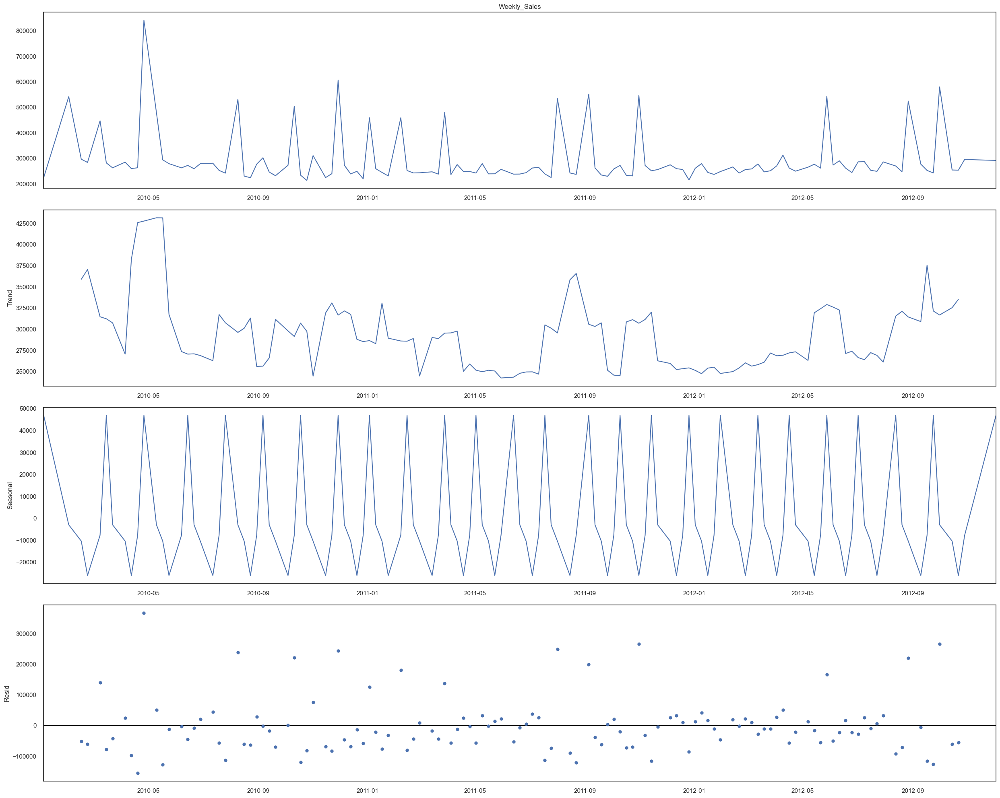

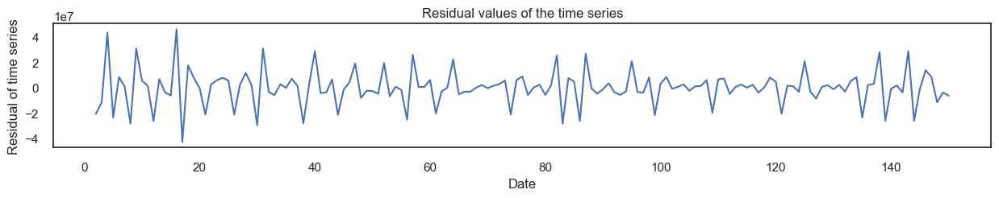

In [79]:
#seasonal & residual
decomposition_store33 = seasonal_decompose(store33_['Weekly_Sales'],model= 'additive', period=5)

plt.rcParams["figure.figsize"] = [25,20] 
decomposition_store33.plot()  
plt.show()

decomposition_residua_s33=decomposition_store33.resid
ax1= decomposition_residual1.plot(figsize=(15,2))
ax1.set_xlabel('Date')
ax1.set_ylabel('Residual of time series')
ax1.set_title('Residual values of the time series')
plt.show()

#### Store 5

In [80]:
store5_ = store5.set_index('weekly')
store5_.sort_index(inplace=True)
store5_

,Store,Weekly_Sales
weekly,,
2010-01-04,5,234977.99
2010-02-01,5,526849.86
2010-02-15,5,303447.57
2010-02-22,5,213756.48
2010-03-08,5,543177.55
...,...,...
2012-10-01,5,540185.94
2012-10-15,5,257632.35
2012-10-22,5,262637.55


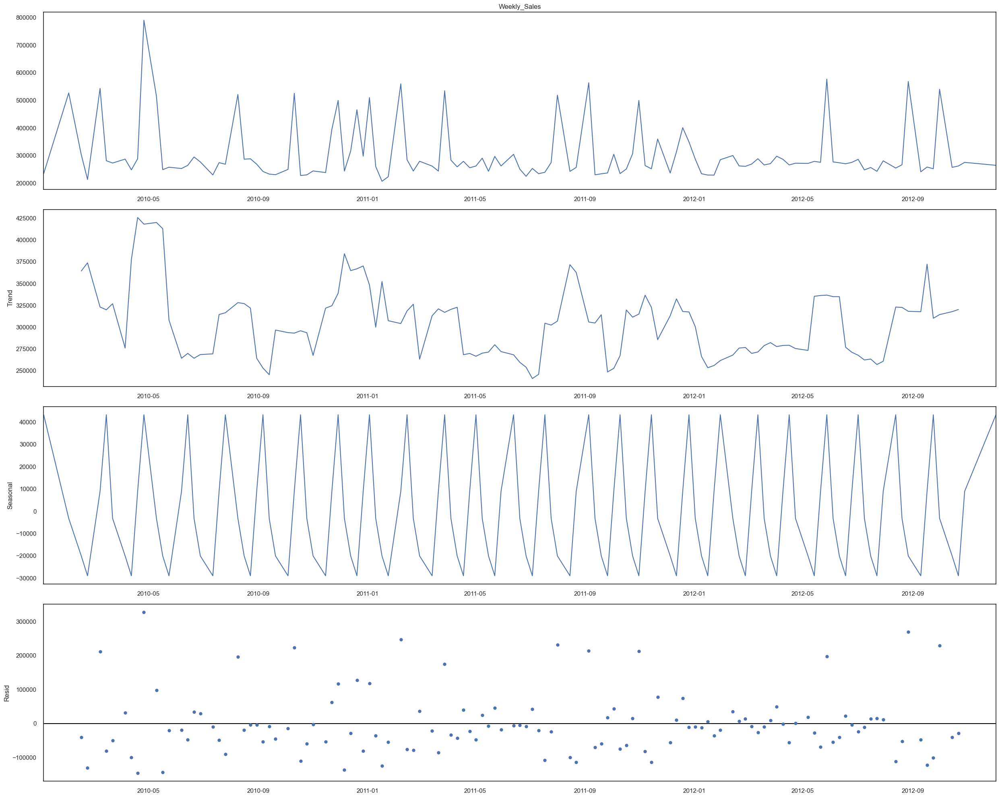

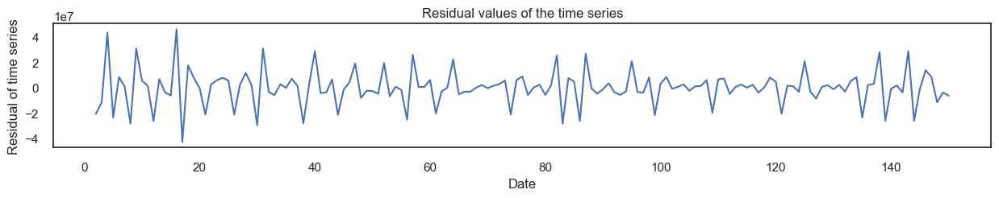

In [81]:
#seasonal & residual
decomposition_store5 = seasonal_decompose(store5_['Weekly_Sales'],model= 'additive', period=5)

plt.rcParams["figure.figsize"] = [25,20] 
decomposition_store5.plot()  
plt.show()

decomposition_residua_s5=decomposition_store5.resid
ax1= decomposition_residual1.plot(figsize=(15,2))
ax1.set_xlabel('Date')
ax1.set_ylabel('Residual of time series')
ax1.set_title('Residual values of the time series')
plt.show()

#### Store 44


In [82]:
store44_ = store44.set_index('weekly')
store44_.sort_index(inplace=True)
store44_


,Store,Weekly_Sales
weekly,,
2010-01-04,44,247626.14
2010-02-01,44,586825.69
2010-02-15,44,267956.30
2010-02-22,44,273079.07
2010-03-08,44,560094.24
...,...,...
2012-10-01,44,608655.05
2012-10-15,44,323766.77
2012-10-22,44,243162.02


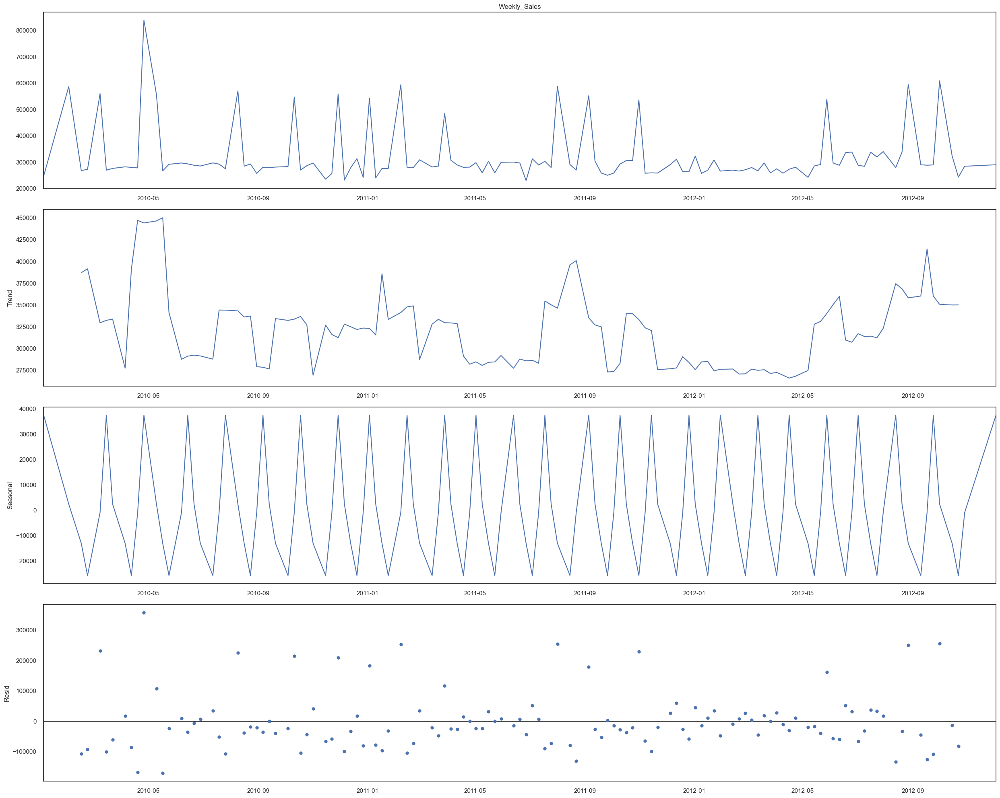

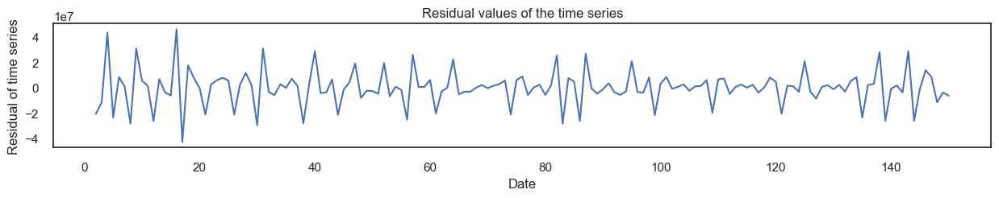

In [83]:
#seasonal & residual
decomposition_store44 = seasonal_decompose(store44_['Weekly_Sales'],model= 'additive', period=5)

plt.rcParams["figure.figsize"] = [25,20] 
decomposition_store44.plot()  
plt.show()

decomposition_residua_s44=decomposition_store44.resid
ax1= decomposition_residual1.plot(figsize=(15,2))
ax1.set_xlabel('Date')
ax1.set_ylabel('Residual of time series')
ax1.set_title('Residual values of the time series')
plt.show()

#### Store 3


In [84]:
store3_ = store3.set_index('weekly')
store3_.sort_index(inplace=True)
store3_


,Store,Weekly_Sales
weekly,,
2010-01-04,3,230119.76
2010-02-01,3,531376.37
2010-02-15,3,301683.41
2010-02-22,3,263116.78
2010-03-08,3,552689.22
...,...,...
2012-10-01,3,640995.68
2012-10-15,3,332685.11
2012-10-22,3,321943.66


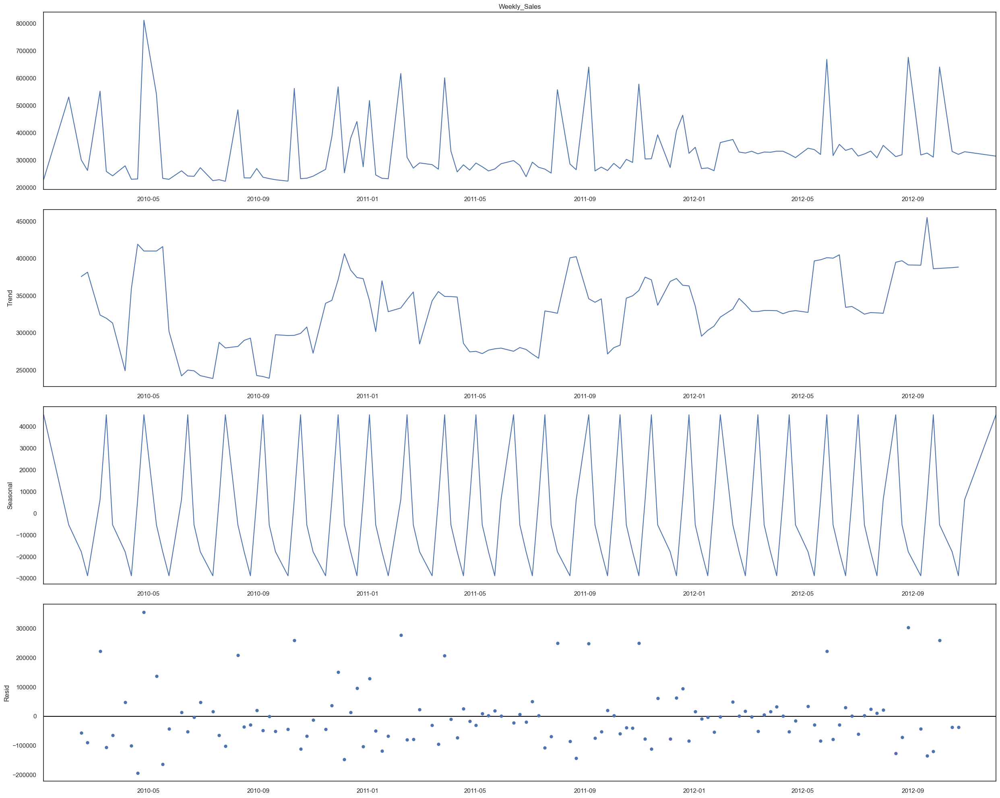

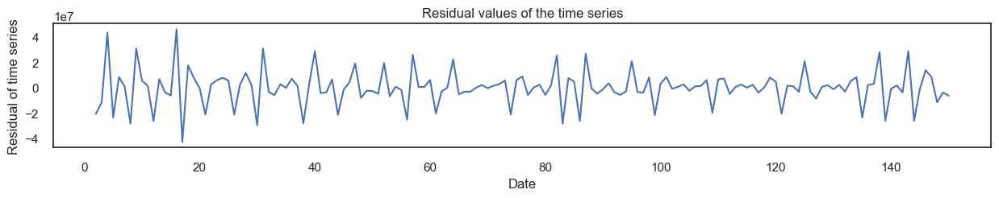

In [85]:
#seasonal & residual
decomposition_store3 = seasonal_decompose(store3_['Weekly_Sales'],model= 'additive', period=5)

plt.rcParams["figure.figsize"] = [25,20] 
decomposition_store3.plot()  
plt.show()

decomposition_residua_s3=decomposition_store3.resid
ax1= decomposition_residual1.plot(figsize=(15,2))
ax1.set_xlabel('Date')
ax1.set_ylabel('Residual of time series')
ax1.set_title('Residual values of the time series')
plt.show()

#### Store 30


In [86]:
store30_ = store30.set_index('weekly')
store30_.sort_index(inplace=True)
store30_


,Store,Weekly_Sales
weekly,,
2010-01-04,30,332042.18
2010-02-01,30,634708.63
2010-02-15,30,339937.60
2010-02-22,30,297636.52
2010-03-08,30,589292.27
...,...,...
2012-10-01,30,642990.05
2012-10-15,30,322970.35
2012-10-22,30,324554.20


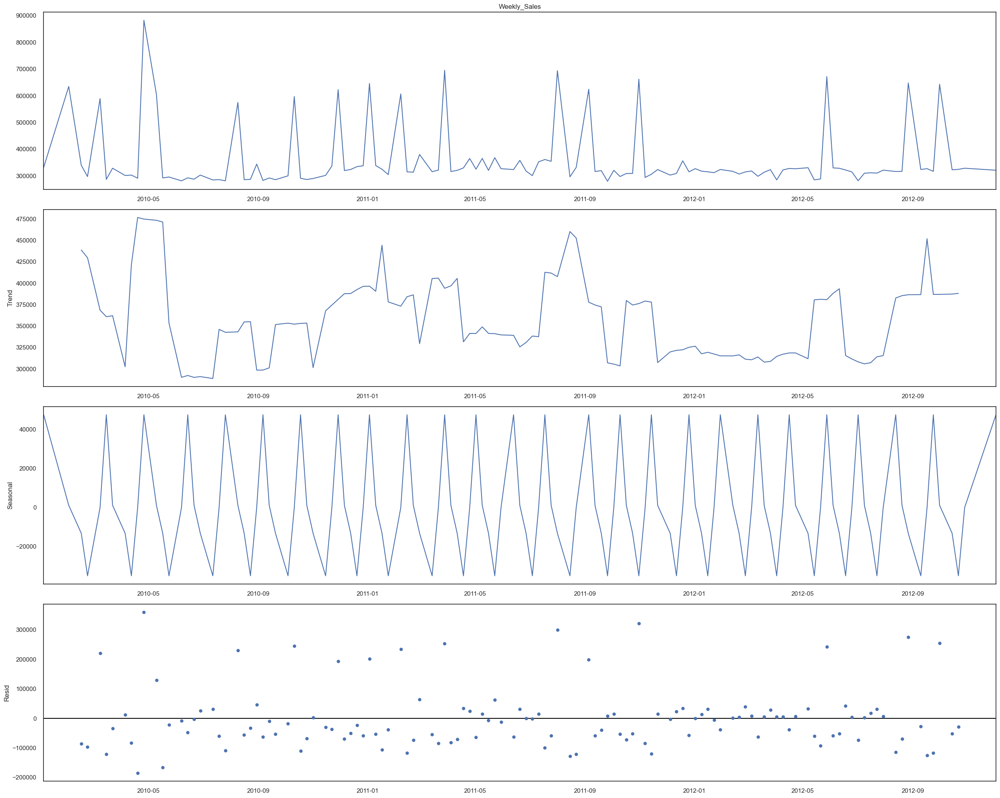

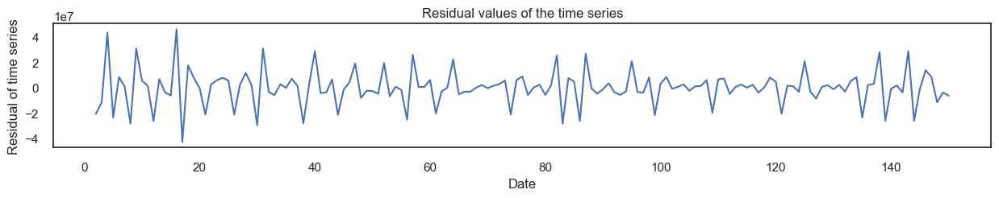

In [87]:
#seasonal & residual
decomposition_store30 = seasonal_decompose(store30_['Weekly_Sales'],model= 'additive', period=5)

plt.rcParams["figure.figsize"] = [25,20] 
decomposition_store30.plot()  
plt.show()

decomposition_residua_s30=decomposition_store30.resid
ax1= decomposition_residual1.plot(figsize=(15,2))
ax1.set_xlabel('Date')
ax1.set_ylabel('Residual of time series')
ax1.set_title('Residual values of the time series')
plt.show()

# ADF test

Test for stationarity Dickey-Fuller test ADF: 
- the test statistic > the critical value, => we fail to reject the null hypothesis (which means the series is not stationary).

- If the test statistic < the critical value, we can reject the null hypothesis (aka the series is stationary). 

Test for stationarity KPSS: 
- If the test statistic >  the critical value, => we reject the null hypothesis (series is not stationary). 
- If the test statistic < the critical value, => if fail to reject the null hypothesis (series is stationary).

It is always better to apply both the tests, so that it can be ensured that the series is truly stationary. Possible outcomes of applying these stationary tests are as follows:

- Case 1: Both tests conclude that the series is not stationary - The series is not stationary

- Case 2: Both tests conclude that the series is stationary - The series is stationary

- Case 3: KPSS indicates stationarity and ADF indicates non-stationarity - The series is trend stationary. Trend needs to be removed to make series strict stationary. The detrended series is checked for stationarity.

- Case 4: KPSS indicates non-stationarity and ADF indicates stationarity - The series is difference stationary. Differencing is to be used to make series stationary. The differenced series is checked for stationarity.

## Overall

In [88]:
# Dickey-Fuller test (the data is stationary or not)
from statsmodels.tsa.stattools import adfuller
def adf_test(timeseries1):
    print("Results of Dickey-Fuller Test:")
    dftest = adfuller(timeseries1, autolag="AIC")
    dfoutput = pd.Series(
        dftest[0:4],
        index=[
            "Test Statistic",
            "p-value",
            "#Lags Used",
            "Number of Observations Used",
        ],
    )
    for key, value in dftest[4].items():
        dfoutput["Critical Value (%s)" % key] = value
    print(dfoutput)

adf_test(timeseries1)

Results of Dickey-Fuller Test:
Test Statistic                -1.457598e+01
p-value                        4.548278e-27
#Lags Used                     0.000000e+00
Number of Observations Used    1.520000e+02
Critical Value (1%)           -3.474121e+00
Critical Value (5%)           -2.880750e+00
Critical Value (10%)          -2.577013e+00
dtype: float64


In [89]:
#define function for kpss test
from statsmodels.tsa.stattools import kpss
#define KPSS
def kpss_test(timeseries1):
    print("Results of KPSS Test:")
    kpsstest = kpss(timeseries1, regression="c", nlags="auto")
    kpss_output = pd.Series(
        kpsstest[0:3], index=["Test Statistic", "p-value", "Lags Used"]
    )
    for key, value in kpsstest[3].items():
        kpss_output["Critical Value (%s)" % key] = value
    print(kpss_output)

kpss_test(timeseries1)

Results of KPSS Test:
Test Statistic           0.145616
p-value                  0.100000
Lags Used                3.000000
Critical Value (10%)     0.347000
Critical Value (5%)      0.463000
Critical Value (2.5%)    0.574000
Critical Value (1%)      0.739000
dtype: float64


c:\Users\LENOVO\miniconda3\envs\shav_\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(


- Dickey-Fuller:
test statistic > the critical value =non stationary 

- KPSS result:
test statistic < critical value = Stationary

Final Result = Stationary

In [90]:
timeseries1

0      27269473.62
1             0.00
2             0.00
3             0.00
4      58997613.58
          ...     
148           0.00
149           0.00
150           0.00
151           0.00
152    28709583.49
Name: Weekly_Sales, Length: 153, dtype: float64

In [91]:
# Difference Transforms
overall_trend ['1 Difference'] = timeseries1 - timeseries1. shift (1)
overall_trend

,weekly,Weekly_Sales,1 Difference
0,2010-01-04,27269473.62,NaN
1,2010-01-11,0.00,-27269473.62
2,2010-01-18,0.00,0.00
3,2010-01-25,0.00,0.00
4,2010-02-01,58997613.58,58997613.58
...,...,...,...
148,2012-11-05,0.00,-29257411.11
149,2012-11-12,0.00,0.00
150,2012-11-19,0.00,0.00
151,2012-11-26,0.00,0.00


Results of Dickey-Fuller Test:
Test Statistic                  -4.817676
p-value                          0.000050
#Lags Used                      14.000000
Number of Observations Used    137.000000
Critical Value (1%)             -3.479007
Critical Value (5%)             -2.882878
Critical Value (10%)            -2.578149
dtype: float64
Results of KPSS Test:


c:\Users\LENOVO\miniconda3\envs\shav_\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(


Test Statistic            0.087062
p-value                   0.100000
Lags Used                24.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64


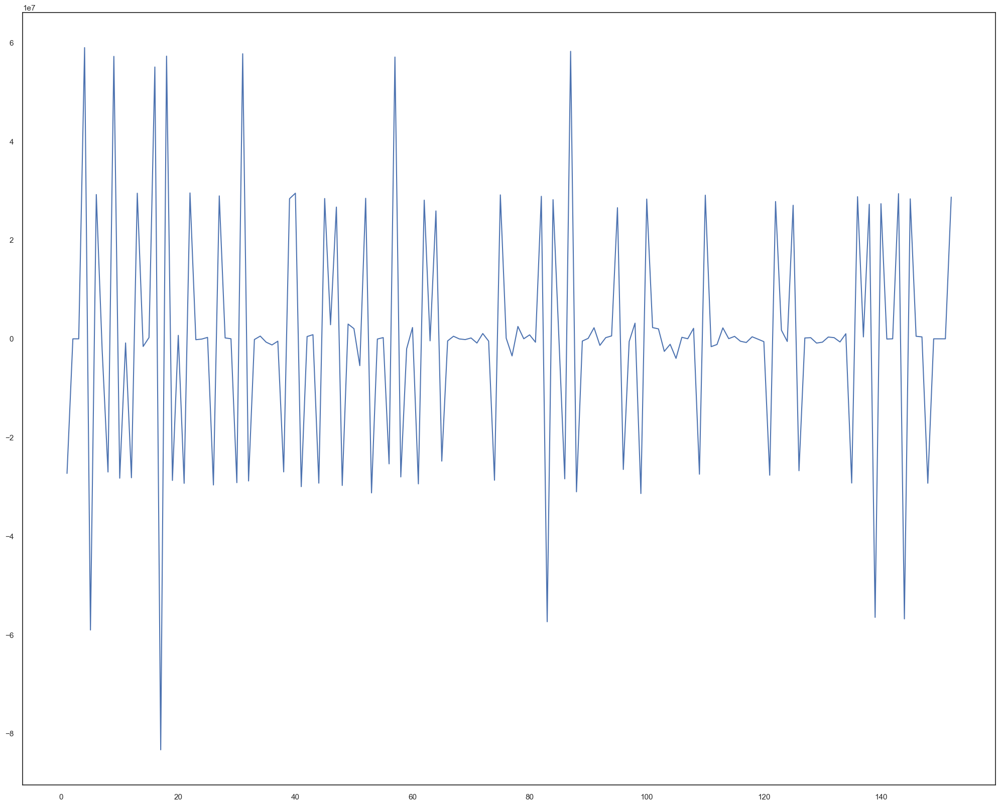

In [92]:
adf_test(overall_trend ['1 Difference'].dropna())
kpss_test(overall_trend ['1 Difference'].dropna())
overall_trend ['1 Difference'].dropna().plot()
plt.show()

After Difference Transforms:

- Dickey-Fuller:
test statistic < the critical value = stationary 

- KPSS result:
test statistic < critical value = Stationary

Final Result = Strict Stationary

## Store

### Store 33

In [93]:
timeseries_s33=store33_['Weekly_Sales']

In [94]:
# Dickey-Fuller test (the data is stationary or not)

def adf_test(timeseries_s33):
    print("Results of Dickey-Fuller Test:")
    dftest = adfuller(timeseries_s33, autolag="AIC")
    dfoutput = pd.Series(
        dftest[0:4],
        index=[
            "Test Statistic",
            "p-value",
            "#Lags Used",
            "Number of Observations Used",
        ],
    )
    for key, value in dftest[4].items():
        dfoutput["Critical Value (%s)" % key] = value
    print(dfoutput)

adf_test(timeseries_s33)

Results of Dickey-Fuller Test:
Test Statistic                -9.316242e+00
p-value                        1.017360e-15
#Lags Used                     1.000000e+00
Number of Observations Used    1.240000e+02
Critical Value (1%)           -3.484220e+00
Critical Value (5%)           -2.885145e+00
Critical Value (10%)          -2.579359e+00
dtype: float64


In [95]:
#define KPSS
def kpss_test(timeseries_s33):
    print("Results of KPSS Test:")
    kpsstest = kpss(timeseries_s33, regression="c", nlags="auto")
    kpss_output = pd.Series(
        kpsstest[0:3], index=["Test Statistic", "p-value", "Lags Used"]
    )
    for key, value in kpsstest[3].items():
        kpss_output["Critical Value (%s)" % key] = value
    print(kpss_output)

kpss_test(timeseries_s33)


Results of KPSS Test:
Test Statistic           0.336103
p-value                  0.100000
Lags Used                5.000000
Critical Value (10%)     0.347000
Critical Value (5%)      0.463000
Critical Value (2.5%)    0.574000
Critical Value (1%)      0.739000
dtype: float64


c:\Users\LENOVO\miniconda3\envs\shav_\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(


- Dickey-Fuller:
test statistic < the critical value = stationary 

- KPSS result:
test statistic < critical value = Stationary

Final Result = Strict Stationary

### Store 5

In [96]:
timeseries_s5=store5_['Weekly_Sales']

In [97]:
# Dickey-Fuller test (the data is stationary or not)

def adf_test(timeseries_s5):
    print("Results of Dickey-Fuller Test:")
    dftest = adfuller(timeseries_s5, autolag="AIC")
    dfoutput = pd.Series(
        dftest[0:4],
        index=[
            "Test Statistic",
            "p-value",
            "#Lags Used",
            "Number of Observations Used",
        ],
    )
    for key, value in dftest[4].items():
        dfoutput["Critical Value (%s)" % key] = value
    print(dfoutput)

adf_test(timeseries_s5)


Results of Dickey-Fuller Test:
Test Statistic                -9.441345e+00
p-value                        4.885309e-16
#Lags Used                     1.000000e+00
Number of Observations Used    1.240000e+02
Critical Value (1%)           -3.484220e+00
Critical Value (5%)           -2.885145e+00
Critical Value (10%)          -2.579359e+00
dtype: float64


In [98]:
#define KPSS
def kpss_test(timeseries_s5):
    print("Results of KPSS Test:")
    kpsstest = kpss(timeseries_s5, regression="c", nlags="auto")
    kpss_output = pd.Series(
        kpsstest[0:3], index=["Test Statistic", "p-value", "Lags Used"]
    )
    for key, value in kpsstest[3].items():
        kpss_output["Critical Value (%s)" % key] = value
    print(kpss_output)

kpss_test(timeseries_s5)



Results of KPSS Test:
Test Statistic           0.289082
p-value                  0.100000
Lags Used                6.000000
Critical Value (10%)     0.347000
Critical Value (5%)      0.463000
Critical Value (2.5%)    0.574000
Critical Value (1%)      0.739000
dtype: float64


c:\Users\LENOVO\miniconda3\envs\shav_\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(


- Dickey-Fuller:
test statistic < the critical value = stationary 

- KPSS result:
test statistic < critical value = Stationary

Final Result = Strict Stationary

### Store 44

In [99]:
timeseries_s44=store44_['Weekly_Sales']
# Dickey-Fuller test (the data is stationary or not)

def adf_test(timeseries_s44):
    print("Results of Dickey-Fuller Test:")
    dftest = adfuller(timeseries_s44, autolag="AIC")
    dfoutput = pd.Series(
        dftest[0:4],
        index=[
            "Test Statistic",
            "p-value",
            "#Lags Used",
            "Number of Observations Used",
        ],
    )
    for key, value in dftest[4].items():
        dfoutput["Critical Value (%s)" % key] = value
    print(dfoutput)

adf_test(timeseries_s44)

Results of Dickey-Fuller Test:
Test Statistic                -9.282920e+00
p-value                        1.237211e-15
#Lags Used                     1.000000e+00
Number of Observations Used    1.240000e+02
Critical Value (1%)           -3.484220e+00
Critical Value (5%)           -2.885145e+00
Critical Value (10%)          -2.579359e+00
dtype: float64


In [100]:
#define KPSS
def kpss_test(timeseries_s44):
    print("Results of KPSS Test:")
    kpsstest = kpss(timeseries_s44, regression="c", nlags="auto")
    kpss_output = pd.Series(
        kpsstest[0:3], index=["Test Statistic", "p-value", "Lags Used"]
    )
    for key, value in kpsstest[3].items():
        kpss_output["Critical Value (%s)" % key] = value
    print(kpss_output)

kpss_test(timeseries_s44)



Results of KPSS Test:
Test Statistic           0.274197
p-value                  0.100000
Lags Used                5.000000
Critical Value (10%)     0.347000
Critical Value (5%)      0.463000
Critical Value (2.5%)    0.574000
Critical Value (1%)      0.739000
dtype: float64


c:\Users\LENOVO\miniconda3\envs\shav_\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(


- Dickey-Fuller:
test statistic < the critical value = stationary 

- KPSS result:
test statistic < critical value = Stationary

Final Result = Strict Stationary

### Store 3

In [101]:
timeseries_s3=store3_['Weekly_Sales']
# Dickey-Fuller test (the data is stationary or not)

def adf_test(timeseries_s3):
    print("Results of Dickey-Fuller Test:")
    dftest = adfuller(timeseries_s3, autolag="AIC")
    dfoutput = pd.Series(
        dftest[0:4],
        index=[
            "Test Statistic",
            "p-value",
            "#Lags Used",
            "Number of Observations Used",
        ],
    )
    for key, value in dftest[4].items():
        dfoutput["Critical Value (%s)" % key] = value
    print(dfoutput)

adf_test(timeseries_s3)



Results of Dickey-Fuller Test:
Test Statistic                -1.139112e+01
p-value                        8.063359e-21
#Lags Used                     0.000000e+00
Number of Observations Used    1.250000e+02
Critical Value (1%)           -3.483779e+00
Critical Value (5%)           -2.884954e+00
Critical Value (10%)          -2.579257e+00
dtype: float64


In [102]:
#define function for kpss test
from statsmodels.tsa.stattools import kpss
#define KPSS
def kpss_test(timeseries_s3):
    print("Results of KPSS Test:")
    kpsstest = kpss(timeseries_s3, regression="c", nlags="auto")
    kpss_output = pd.Series(
        kpsstest[0:3], index=["Test Statistic", "p-value", "Lags Used"]
    )
    for key, value in kpsstest[3].items():
        kpss_output["Critical Value (%s)" % key] = value
    print(kpss_output)

kpss_test(timeseries_s3)



Results of KPSS Test:
Test Statistic           0.352248
p-value                  0.097738
Lags Used                4.000000
Critical Value (10%)     0.347000
Critical Value (5%)      0.463000
Critical Value (2.5%)    0.574000
Critical Value (1%)      0.739000
dtype: float64


- Dickey-Fuller:
test statistic > the critical value =non stationary 

- KPSS result:
test statistic > critical value(10%) = non Stationary

Final Result = non Stationary

In [103]:
# Difference Transforms
store3_ ['1 Difference'] = timeseries_s3 - timeseries_s3. shift (1)
store3_


,Store,Weekly_Sales,1 Difference
weekly,,,
2010-01-04,3,230119.76,NaN
2010-02-01,3,531376.37,301256.61
2010-02-15,3,301683.41,-229692.96
2010-02-22,3,263116.78,-38566.63
2010-03-08,3,552689.22,289572.44
...,...,...,...
2012-10-01,3,640995.68,329135.19
2012-10-15,3,332685.11,-308310.57
2012-10-22,3,321943.66,-10741.45


Results of Dickey-Fuller Test:
Test Statistic                -9.873333e+00
p-value                        3.941563e-17
#Lags Used                     4.000000e+00
Number of Observations Used    1.200000e+02
Critical Value (1%)           -3.486056e+00
Critical Value (5%)           -2.885943e+00
Critical Value (10%)          -2.579785e+00
dtype: float64
Results of KPSS Test:
Test Statistic            0.121592
p-value                   0.100000
Lags Used                24.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64


c:\Users\LENOVO\miniconda3\envs\shav_\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(


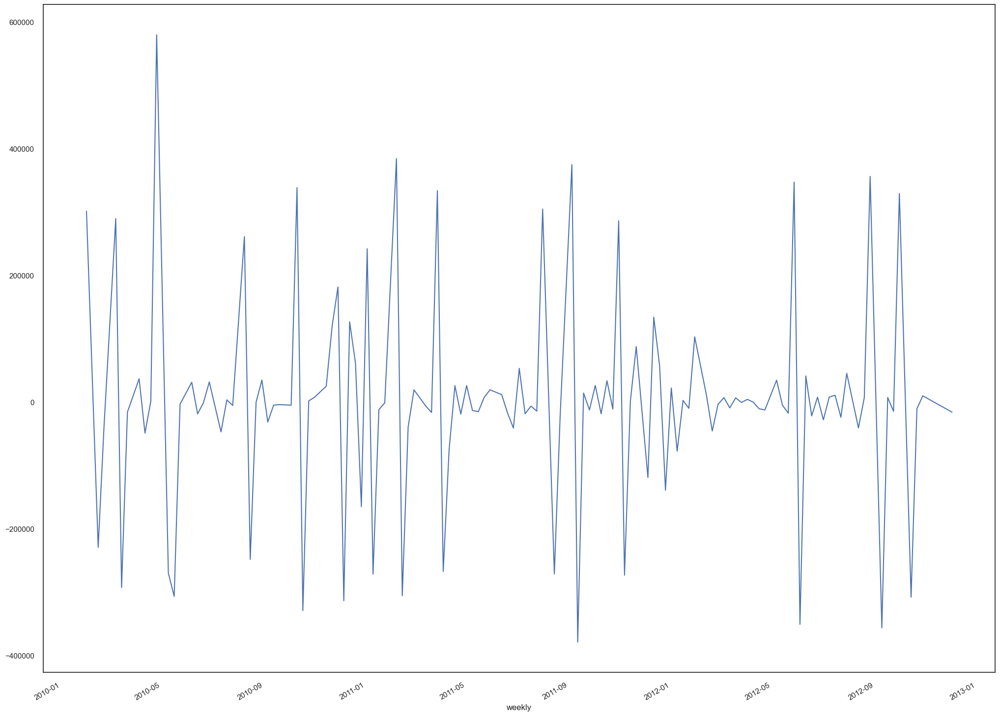

In [104]:
adf_test(store3_ ['1 Difference'].dropna())
kpss_test(store3_ ['1 Difference'].dropna())
store3_ ['1 Difference'].dropna().plot()
plt.show()


After Difference Transforms:

- Dickey-Fuller:
test statistic < the critical value = stationary 

- KPSS result:
test statistic < critical value = Stationary

Final Result = Strict Stationary

### Store 30

In [105]:
timeseries_s30=store30_['Weekly_Sales']
# Dickey-Fuller test (the data is stationary or not)

def adf_test(timeseries_s30):
    print("Results of Dickey-Fuller Test:")
    dftest = adfuller(timeseries_s30, autolag="AIC")
    dfoutput = pd.Series(
        dftest[0:4],
        index=[
            "Test Statistic",
            "p-value",
            "#Lags Used",
            "Number of Observations Used",
        ],
    )
    for key, value in dftest[4].items():
        dfoutput["Critical Value (%s)" % key] = value
    print(dfoutput)

adf_test(timeseries_s30)



Results of Dickey-Fuller Test:
Test Statistic                -1.154370e+01
p-value                        3.583306e-21
#Lags Used                     0.000000e+00
Number of Observations Used    1.250000e+02
Critical Value (1%)           -3.483779e+00
Critical Value (5%)           -2.884954e+00
Critical Value (10%)          -2.579257e+00
dtype: float64


In [106]:
#define KPSS
def kpss_test(timeseries_s30):
    print("Results of KPSS Test:")
    kpsstest = kpss(timeseries_s30, regression="c", nlags="auto")
    kpss_output = pd.Series(
        kpsstest[0:3], index=["Test Statistic", "p-value", "Lags Used"]
    )
    for key, value in kpsstest[3].items():
        kpss_output["Critical Value (%s)" % key] = value
    print(kpss_output)

kpss_test(timeseries_s30)



Results of KPSS Test:
Test Statistic           0.199487
p-value                  0.100000
Lags Used                5.000000
Critical Value (10%)     0.347000
Critical Value (5%)      0.463000
Critical Value (2.5%)    0.574000
Critical Value (1%)      0.739000
dtype: float64


c:\Users\LENOVO\miniconda3\envs\shav_\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(


- Dickey-Fuller:
test statistic > the critical value =non stationary 

- KPSS result:
test statistic < critical value = Stationary

Final Result = Stationary

In [107]:
# Difference Transforms
store30_ ['1 Difference'] = timeseries_s30 - timeseries_s30. shift (1)
store30_

,Store,Weekly_Sales,1 Difference
weekly,,,
2010-01-04,30,332042.18,NaN
2010-02-01,30,634708.63,302666.45
2010-02-15,30,339937.60,-294771.03
2010-02-22,30,297636.52,-42301.08
2010-03-08,30,589292.27,291655.75
...,...,...,...
2012-10-01,30,642990.05,325726.68
2012-10-15,30,322970.35,-320019.70
2012-10-22,30,324554.20,1583.85


Results of Dickey-Fuller Test:
Test Statistic                -7.212794e+00
p-value                        2.212371e-10
#Lags Used                     9.000000e+00
Number of Observations Used    1.150000e+02
Critical Value (1%)           -3.488535e+00
Critical Value (5%)           -2.887020e+00
Critical Value (10%)          -2.580360e+00
dtype: float64
Results of KPSS Test:


c:\Users\LENOVO\miniconda3\envs\shav_\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(


Test Statistic            0.103706
p-value                   0.100000
Lags Used                25.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64


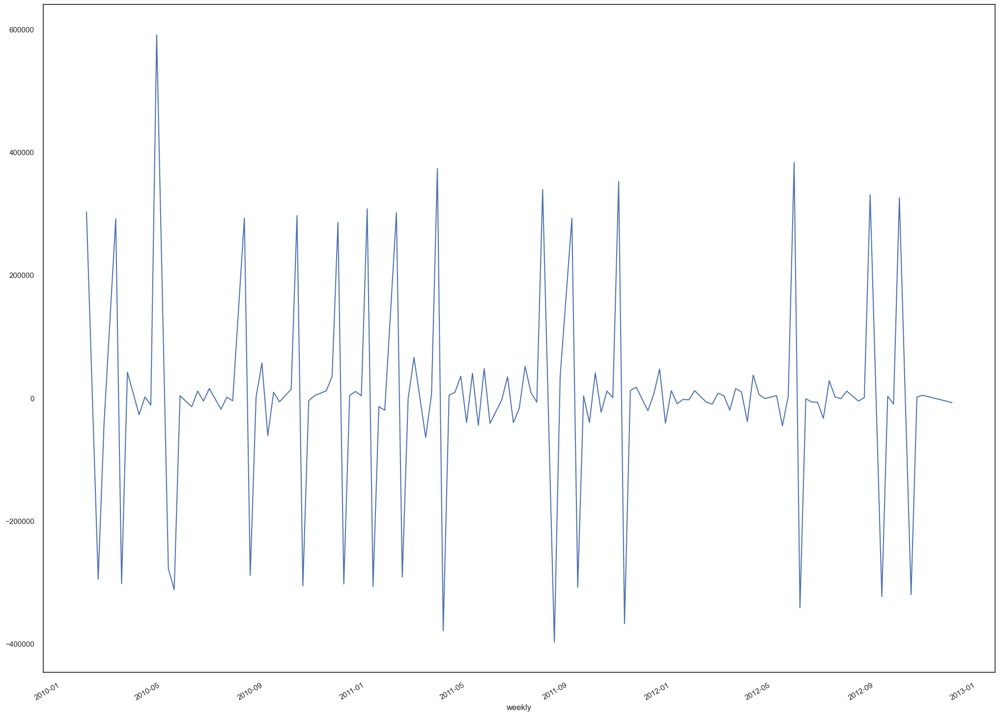

In [108]:
adf_test(store30_ ['1 Difference'].dropna())
kpss_test(store30_ ['1 Difference'].dropna())
store30_ ['1 Difference'].dropna().plot()
plt.show()

After Difference Transforms:

- Dickey-Fuller:
test statistic < the critical value = stationary 

- KPSS result:
test statistic < critical value = Stationary

Final Result = Strict Stationary

# Autocorellation

The autocorrelation analysis helps detect patterns and check for randomness.

The analysis involves looking at the Autocorrelation Function (ACF) and Partial Autocorrelation Function (PACF) plots.

In [109]:
#import
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf

if the line outside blue box -> high correlation (up = positive, down = negative).

Similar fluctuation means there's correlation

## Overall

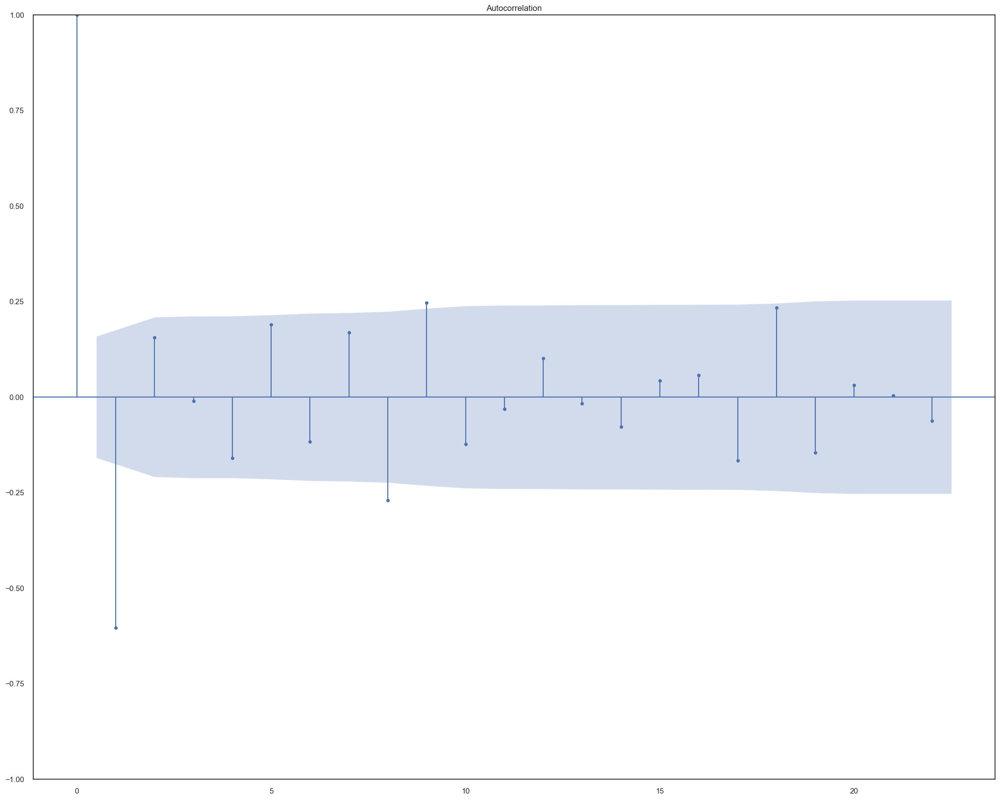

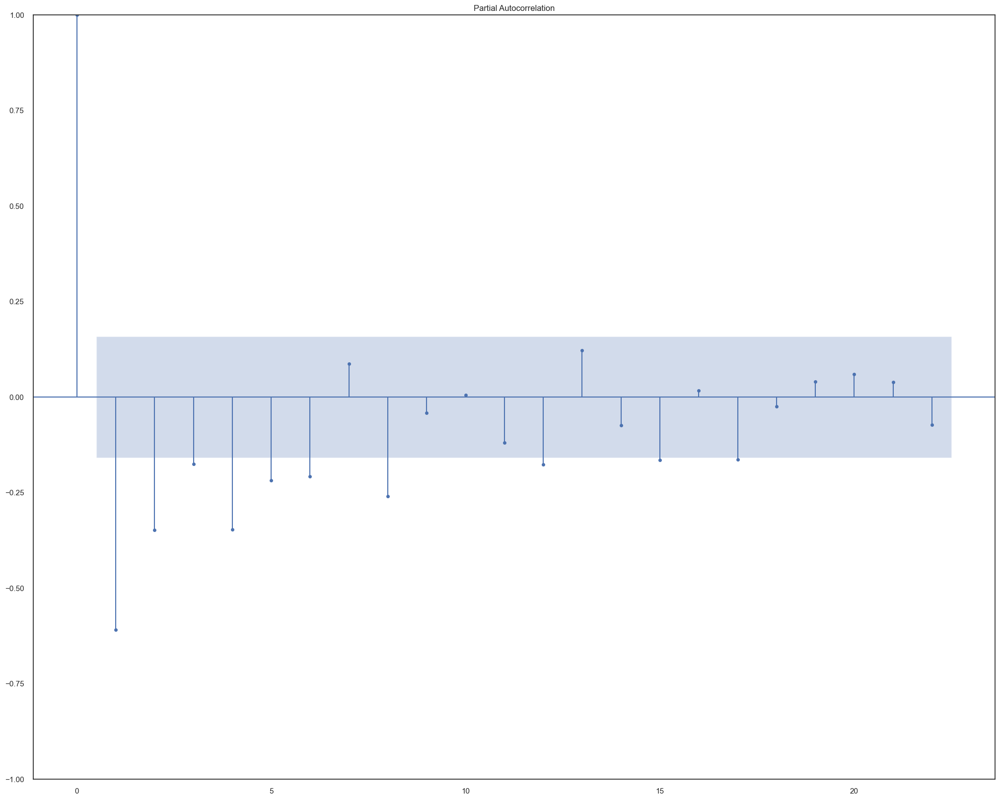

In [110]:
plot_acf(overall_trend ['1 Difference'].dropna())
plot_pacf(overall_trend ['1 Difference'].dropna(), method = "ols")

plt.show()

- Both there is lag of 0 , which is the correlation of the time series with itself and therefore results in a correlation of 1.
- There are several autocorrelations that are significantly non-zero. Therefore, the time series is non-random.
- the ACF cuts after 1 lag while the PACF shows a slowly decreasing trend.

The ACF and PACF plots indicate that an MA (1) model would be appropriate

## Store

### Store 33

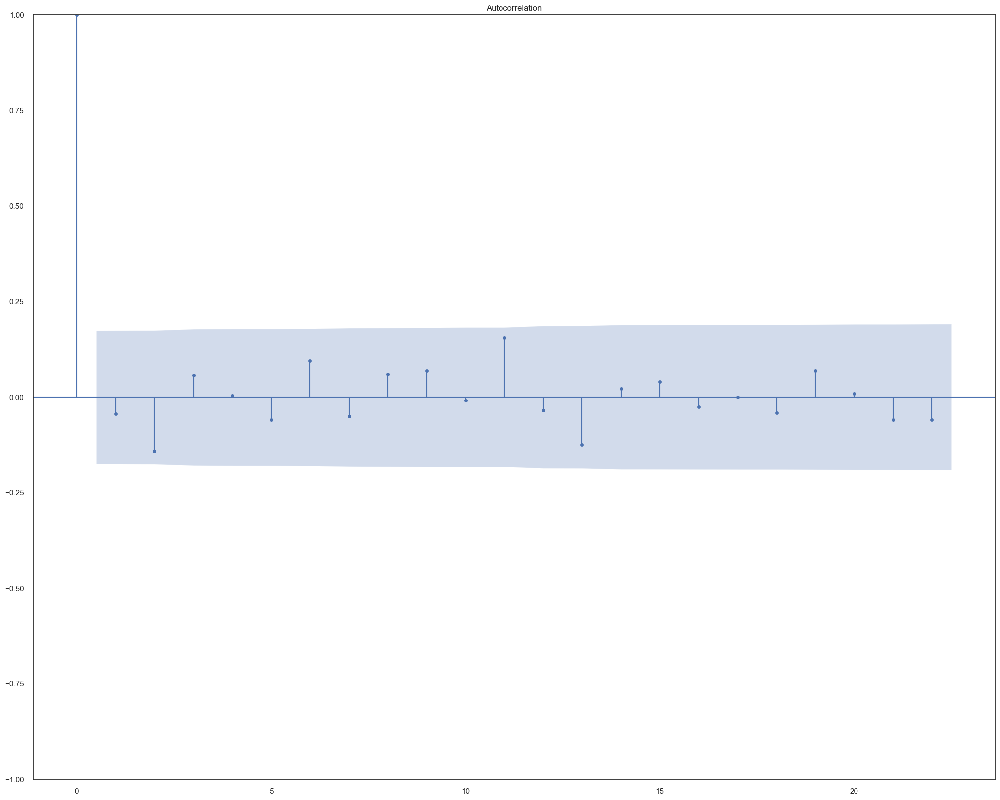

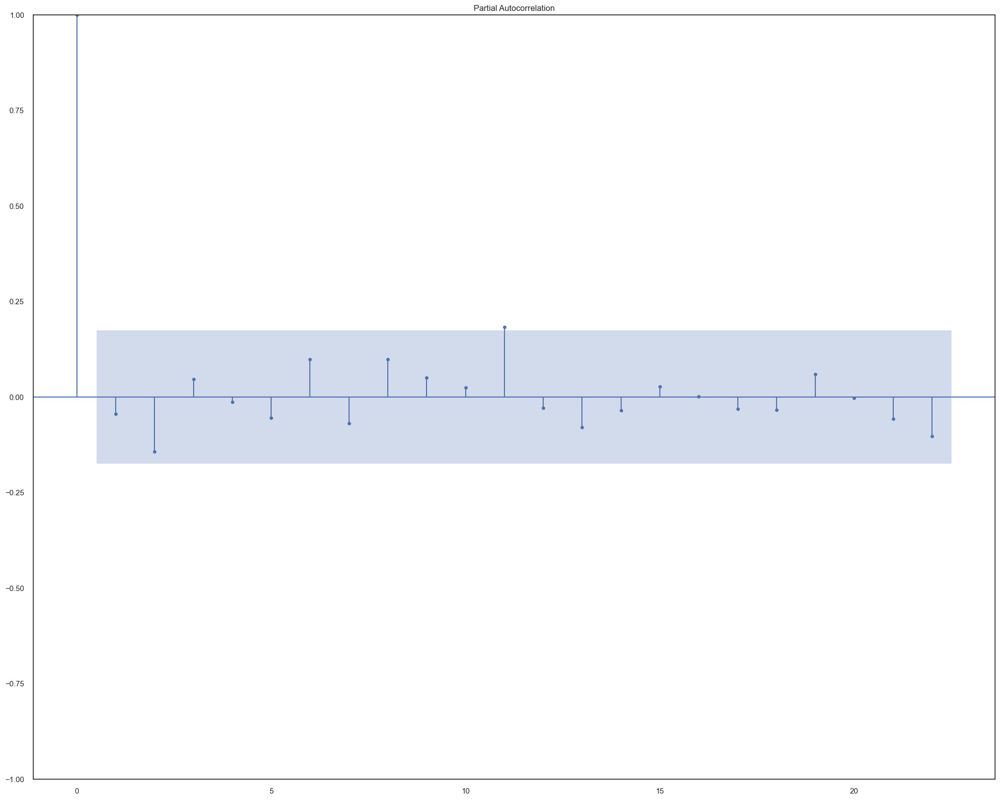

In [111]:
plot_acf(timeseries_s33)
plot_pacf(timeseries_s33, method = "ols")

plt.show()

- Both there is lag of 0 , which is the correlation of the time series with itself and therefore results in a correlation of 1.
- there are no other lag and exponential show

The ACF and PACF plots indicate that a white noise, so the process is uncorrelated. 

*Cant use for future forcasting model

### Store 5

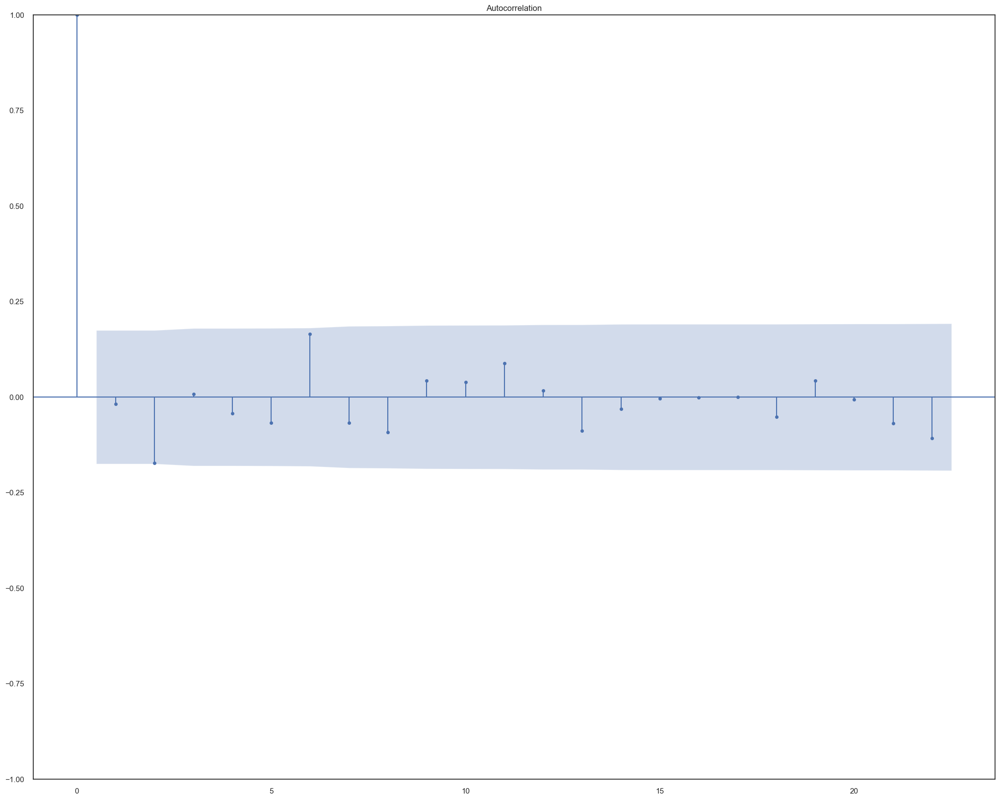

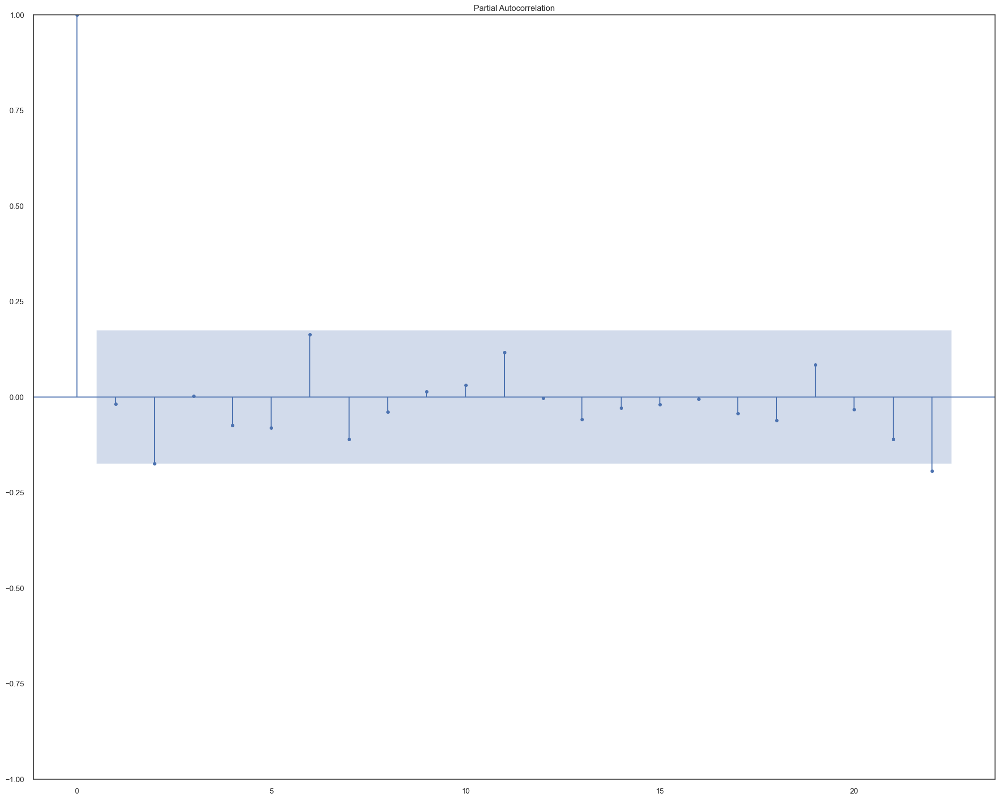

In [112]:
plot_acf(timeseries_s5)
plot_pacf(timeseries_s5, method = "ols")

plt.show()

- Both there is lag of 0 , which is the correlation of the time series with itself and therefore results in a correlation of 1.
- there are no other lag and exponential show

The ACF and PACF plots indicate that a white noise, so the process is uncorrelated. 

*Cant use for future forcasting model

### Store 44

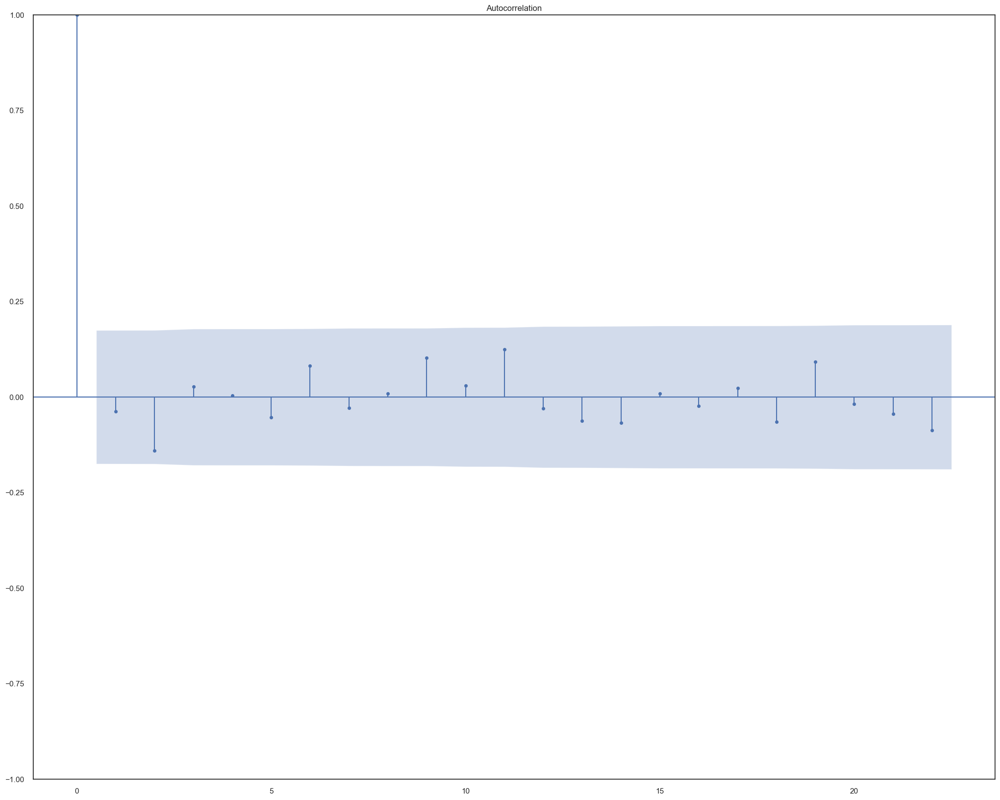

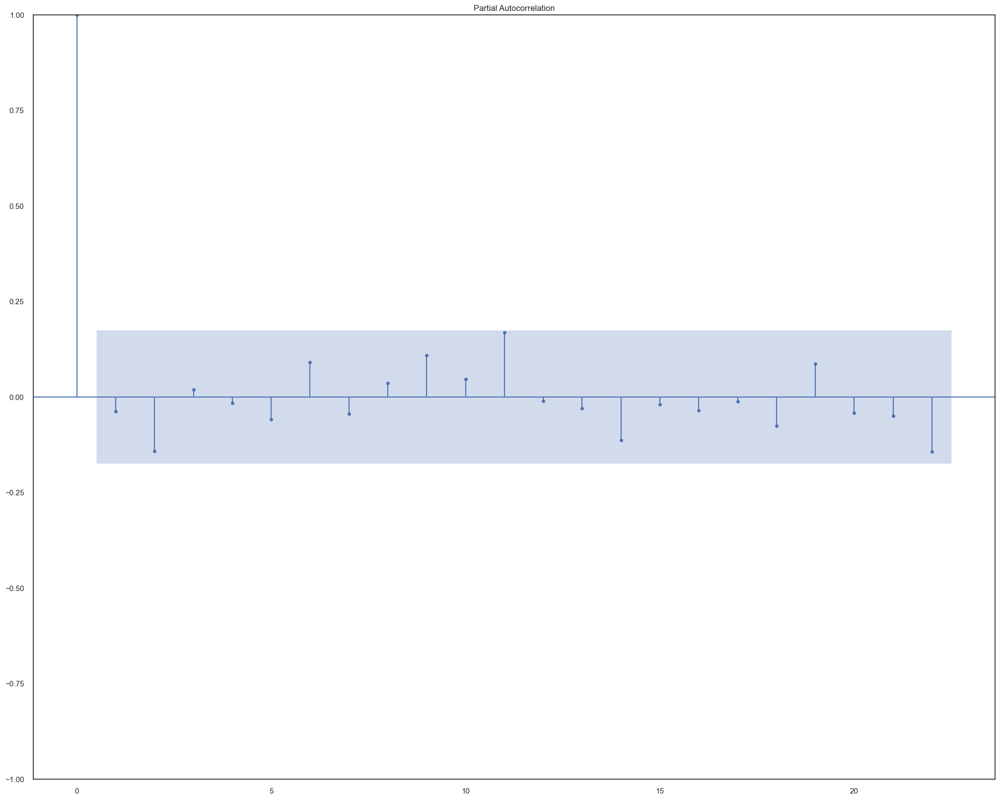

In [113]:
plot_acf(timeseries_s44)
plot_pacf(timeseries_s44, method = "ols")

plt.show()

- Both there is lag of 0 , which is the correlation of the time series with itself and therefore results in a correlation of 1.
- there are no other lag and exponential show

The ACF and PACF plots indicate that a white noise, so the process is uncorrelated. 

*Cant use for future forcasting model

### Store 3

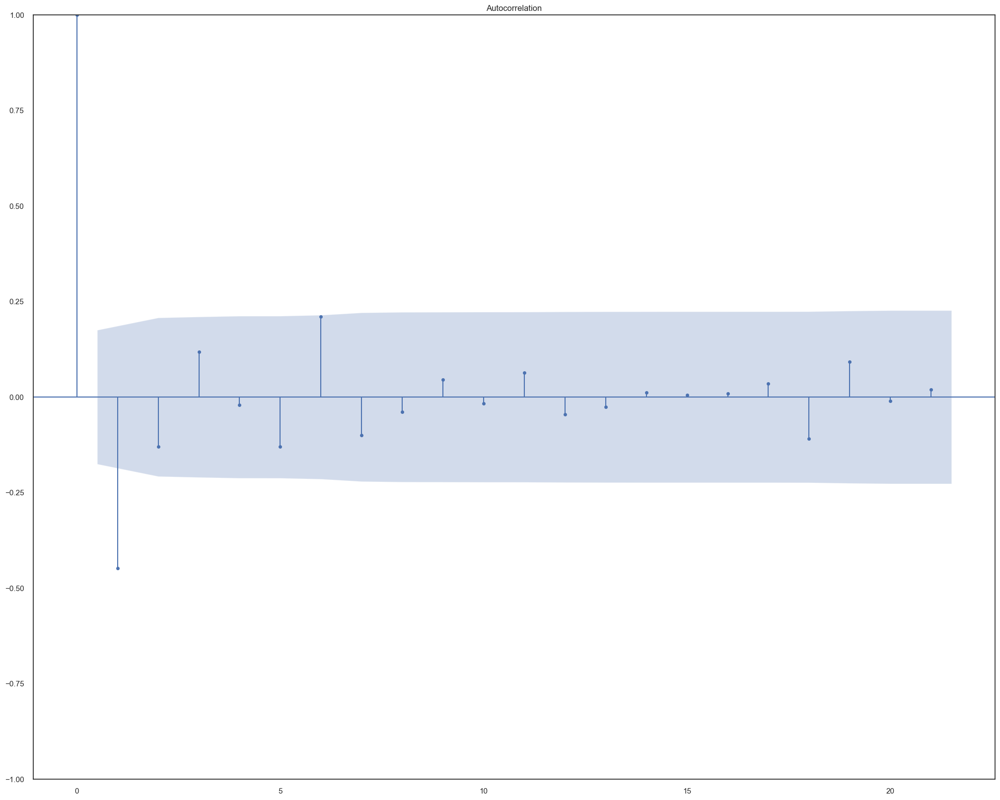

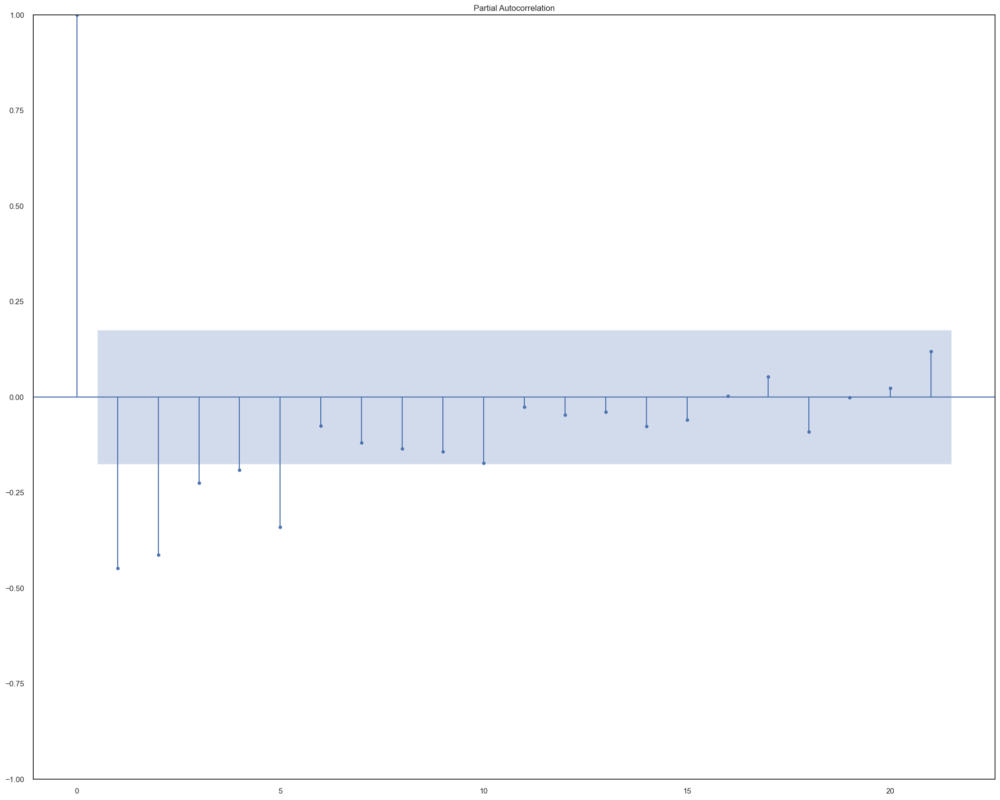

In [114]:
plot_acf(store3_ ['1 Difference'].dropna())
plot_pacf(store3_ ['1 Difference'].dropna(), method = "ols")

plt.show()

- Both there is lag of 0 , which is the correlation of the time series with itself and therefore results in a correlation of 1.
- There are several autocorrelations that are significantly non-zero. Therefore, the time series is non-random.
- the ACF cuts after 1 lag while the PACF shows a slowly decreasing trend. 

The ACF and PACF plots indicate that an MA (1) model would be appropriate

### Store 30

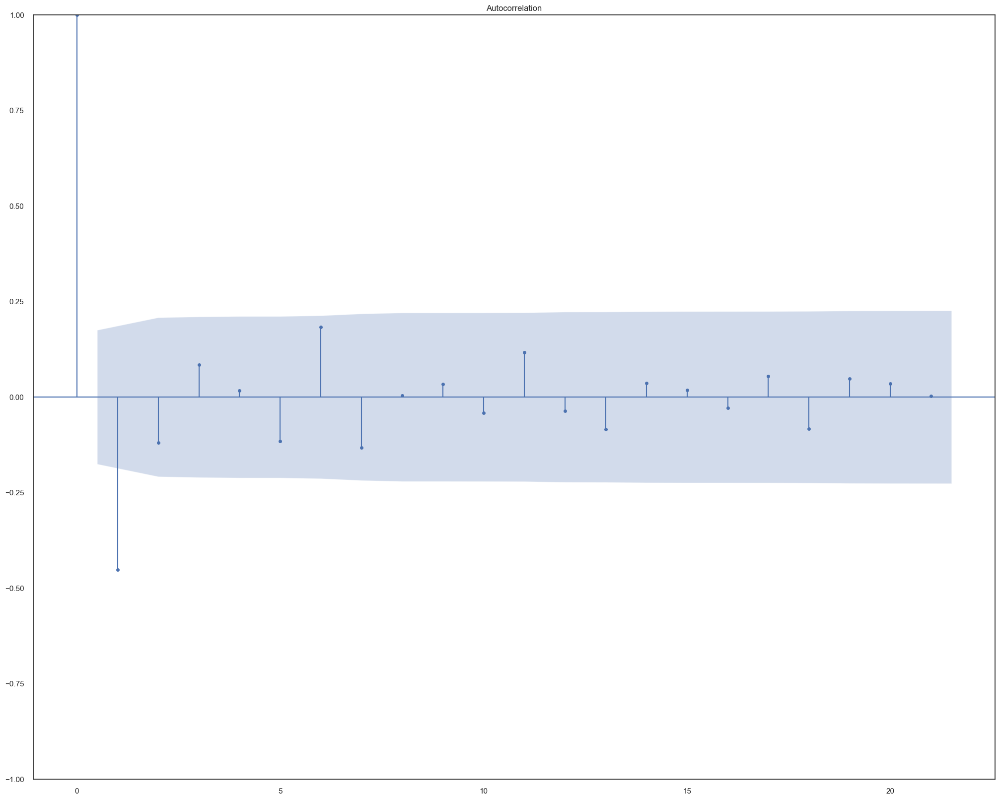

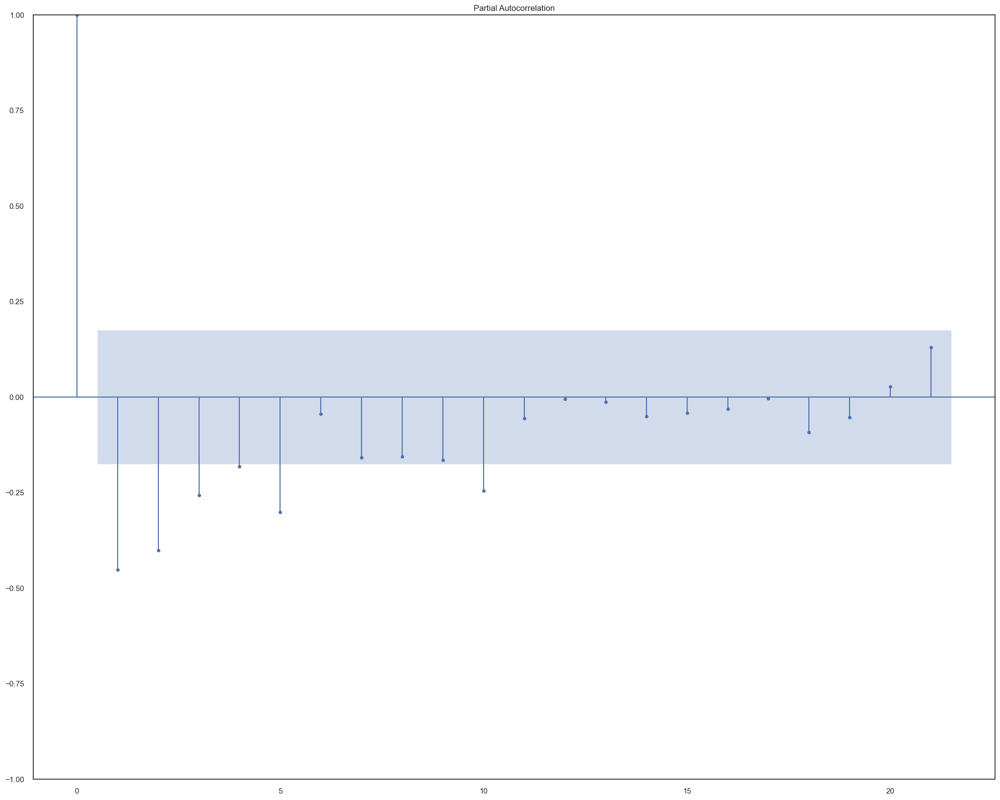

In [115]:
plot_acf(store30_ ['1 Difference'].dropna())
plot_pacf(store30_ ['1 Difference'].dropna(), method = "ols")

plt.show()

- Both there is lag of 0 , which is the correlation of the time series with itself and therefore results in a correlation of 1.
- There are several autocorrelations that are significantly non-zero. Therefore, the time series is non-random.
- the ACF cuts after 1 lag while the PACF shows a slowly decreasing trend. 

The ACF and PACF plots indicate that an MA (1) model would be appropriate

# Modelling

Store 44 no need modelling

## MA

In [116]:
from scipy import stats
from statsmodels.tsa.arima.model import ARIMA

### Overall

In [117]:
overall_trend

,weekly,Weekly_Sales,1 Difference
0,2010-01-04,27269473.62,NaN
1,2010-01-11,0.00,-27269473.62
2,2010-01-18,0.00,0.00
3,2010-01-25,0.00,0.00
4,2010-02-01,58997613.58,58997613.58
...,...,...,...
148,2012-11-05,0.00,-29257411.11
149,2012-11-12,0.00,0.00
150,2012-11-19,0.00,0.00
151,2012-11-26,0.00,0.00


In [118]:
o=['weekly','1 Difference']
trend_o=overall_trend[o]
trend_o.head()

,weekly,1 Difference
0,2010-01-04,NaN
1,2010-01-11,-27269473.62
2,2010-01-18,0.00
3,2010-01-25,0.00
4,2010-02-01,58997613.58


In [119]:
trend_o=trend_o.rename(columns={'1 Difference':'overall'})
trend_o.head()

,weekly,overall
0,2010-01-04,NaN
1,2010-01-11,-27269473.62
2,2010-01-18,0.00
3,2010-01-25,0.00
4,2010-02-01,58997613.58


In [120]:
train_len_o= int(0.75*(len(trend_o)))
test_len_o = len(trend_o) - train_len_o
train_overall= trend_o ['overall'][:train_len_o] 
test_overall= trend_o ['overall'][test_len_o:] 
ma_model_overall = ARIMA(train_overall, order=(1,0,1)).fit()

print(ma_model_overall.summary())

                               SARIMAX Results                                
Dep. Variable:                overall   No. Observations:                  114
Model:                 ARIMA(1, 0, 1)   Log Likelihood               -2034.024
Date:                Fri, 14 Apr 2023   AIC                           4076.047
Time:                        20:56:53   BIC                           4086.992
Sample:                             0   HQIC                          4080.489
                                - 114                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.161e+04   7.56e+04      0.154      0.878   -1.37e+05     1.6e+05
ar.L1         -0.2351      0.141     -1.669      0.095      -0.511       0.041
ma.L1         -0.9889      0.114     -8.699      0.0

In [121]:
train_overall

0              NaN
1     -27269473.62
2             0.00
3             0.00
4      58997613.58
          ...     
109   -27431277.18
110    29101939.45
111    -1587090.55
112    -1151043.15
113     2217494.33
Name: overall, Length: 114, dtype: float64

In [122]:
test_overall

39     28391114.93
40     29501411.04
41    -29951521.34
42       459077.16
43       839545.31
          ...     
148   -29257411.11
149           0.00
150           0.00
151           0.00
152    28709583.49
Name: overall, Length: 114, dtype: float64

In [124]:
pred_o= ma_model_overall.predict(start=len(trend_o), end=len(trend_o)+51, dynamic=False)
pred_o

153    11609.084096
154    11609.084096
155    11609.084096
156    11609.084096
157    11609.084096
158    11609.084096
159    11609.084096
160    11609.084096
161    11609.084096
162    11609.084096
163    11609.084096
164    11609.084096
165    11609.084096
166    11609.084096
167    11609.084096
168    11609.084096
169    11609.084096
170    11609.084096
171    11609.084096
172    11609.084096
173    11609.084096
174    11609.084096
175    11609.084096
176    11609.084096
177    11609.084096
178    11609.084096
179    11609.084096
180    11609.084096
181    11609.084096
182    11609.084096
183    11609.084096
184    11609.084096
185    11609.084096
186    11609.084096
187    11609.084096
188    11609.084096
189    11609.084096
190    11609.084096
191    11609.084096
192    11609.084096
193    11609.084096
194    11609.084096
195    11609.084096
196    11609.084096
197    11609.084096
198    11609.084096
199    11609.084096
200    11609.084096
201    11609.084096
202    11609.084096


In [126]:
pred_index_o = pd.date_range(start=trend_o['weekly'].iloc[train_len_o], periods=len(pred_o), freq='W')


In [128]:
pred_o_= pd.DataFrame({'weekly': pred_index_o, 'predicted_values': pred_o})
pred_o_.head()

,weekly,predicted_values
153,2012-03-18,11609.084096
154,2012-03-25,11609.084096
155,2012-04-01,11609.084096
156,2012-04-08,11609.084096
157,2012-04-15,11609.084096


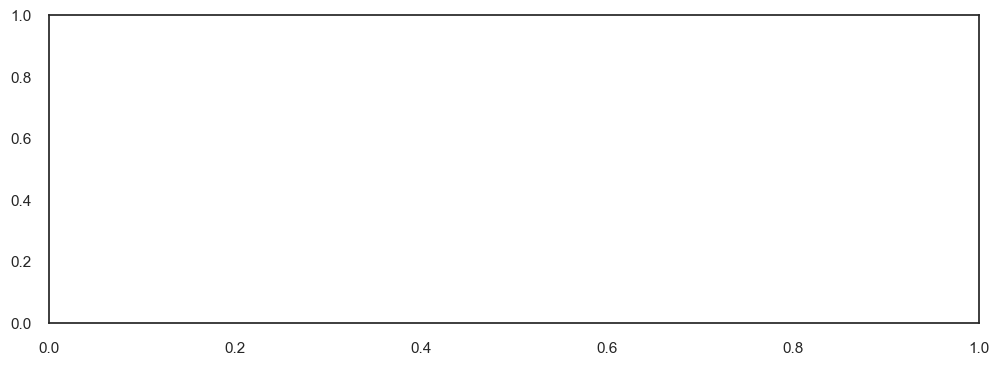

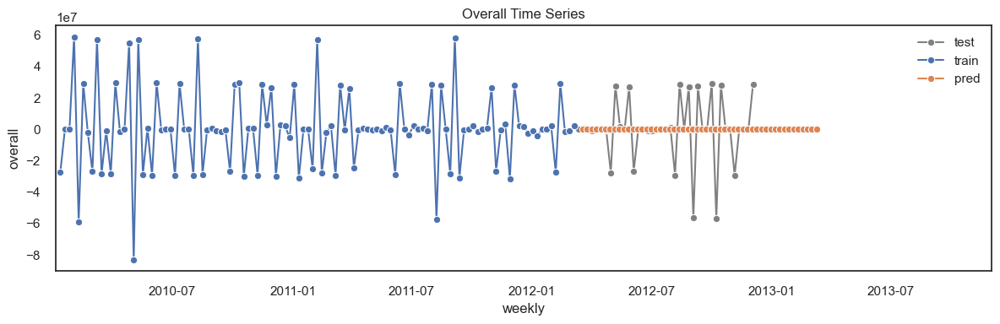

In [130]:
f, ax = plt.subplots(nrows=1, ncols=1, figsize=(12, 4))
sns.lineplot(data=trend_o[-test_len_o:], x='weekly', y='overall', marker='o', label='test', color='grey')
sns.lineplot(data=trend_o[:train_len_o], x='weekly', y='overall', marker='o', label='train')
sns.lineplot(data=pred_o_, x='weekly', y='predicted_values', marker='o', label='pred')
ax.set_xlim([trend_o['weekly'].iloc[0], trend_o['weekly'].iloc[-1]+pd.DateOffset(weeks=52)])
ax.set_title('Overall Time Series')
plt.tight_layout()
plt.show()

### Store 3

In [132]:
s3=store3_.reset_index()
s3

,weekly,Store,Weekly_Sales,1 Difference
0,2010-01-04,3,230119.76,NaN
1,2010-02-01,3,531376.37,301256.61
2,2010-02-15,3,301683.41,-229692.96
3,2010-02-22,3,263116.78,-38566.63
4,2010-03-08,3,552689.22,289572.44
...,...,...,...,...
121,2012-10-01,3,640995.68,329135.19
122,2012-10-15,3,332685.11,-308310.57
123,2012-10-22,3,321943.66,-10741.45
124,2012-10-29,3,331602.92,9659.26


In [133]:
o=['weekly','1 Difference']
trend_3=s3[o]

trend_3=trend_3.rename(columns={'1 Difference':'overall'})
trend_3.head()

,weekly,overall
0,2010-01-04,NaN
1,2010-02-01,301256.61
2,2010-02-15,-229692.96
3,2010-02-22,-38566.63
4,2010-03-08,289572.44


In [135]:
train_len_3= int(0.75*(len(trend_3)))
test_len_3 = len(trend_3) - train_len_3
train_3= trend_3 ['overall'][:train_len_3] 
test_3= trend_3 ['overall'][test_len_3:] 
ma_model_3 = ARIMA(train_3, order=(1,0,1)).fit()

print(ma_model_3.summary())

                               SARIMAX Results                                
Dep. Variable:                overall   No. Observations:                   94
Model:                 ARIMA(1, 0, 1)   Log Likelihood               -1222.208
Date:                Fri, 14 Apr 2023   AIC                           2452.416
Time:                        21:25:34   BIC                           2462.589
Sample:                             0   HQIC                          2456.525
                                 - 94                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        174.8617   1039.841      0.168      0.866   -1863.190    2212.913
ar.L1         -0.0058      0.160     -0.036      0.971      -0.320       0.309
ma.L1         -0.9898      0.165     -5.988      0.0

In [136]:
train_3

0           NaN
1     301256.61
2    -229692.96
3     -38566.63
4     289572.44
        ...    
89    -10088.95
90    102753.41
91     11171.45
92    -45909.17
93     -3663.93
Name: overall, Length: 94, dtype: float64

In [137]:
test_3

32       7394.90
33      24940.07
34     119686.96
35     181588.66
36    -313934.74
         ...    
121    329135.19
122   -308310.57
123    -10741.45
124      9659.26
125    -16131.88
Name: overall, Length: 94, dtype: float64

In [138]:
pred_3= ma_model_3.predict(start=len(trend_3), end=len(trend_3)+51, dynamic=False)
pred_index_3 = pd.date_range(start=trend_3['weekly'].iloc[train_len_3], periods=len(pred_3), freq='W')

pred_3_= pd.DataFrame({'weekly': pred_index_3, 'predicted_values': pred_3})
pred_3_.head()

,weekly,predicted_values
126,2012-03-11,174.861675
127,2012-03-18,174.861675
128,2012-03-25,174.861675
129,2012-04-01,174.861675
130,2012-04-08,174.861675


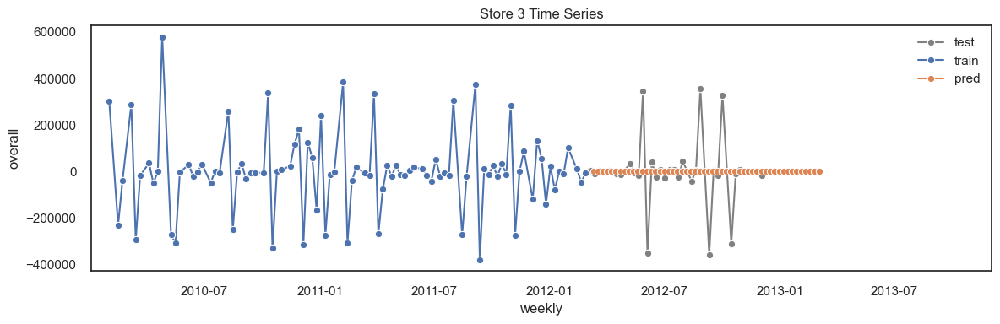

In [140]:
f, ax = plt.subplots(nrows=1, ncols=1, figsize=(12, 4))
sns.lineplot(data=trend_3[-test_len_3:], x='weekly', y='overall', marker='o', label='test', color='grey')
sns.lineplot(data=trend_3[:train_len_3], x='weekly', y='overall', marker='o', label='train')
sns.lineplot(data=pred_3_, x='weekly', y='predicted_values', marker='o', label='pred')
ax.set_xlim([trend_3['weekly'].iloc[0], trend_3['weekly'].iloc[-1]+pd.DateOffset(weeks=52)])
ax.set_title('Store 3 Time Series')
plt.tight_layout()
plt.show()

### Store 30

In [141]:
s30=store30_.reset_index()
s30

,weekly,Store,Weekly_Sales,1 Difference
0,2010-01-04,30,332042.18,NaN
1,2010-02-01,30,634708.63,302666.45
2,2010-02-15,30,339937.60,-294771.03
3,2010-02-22,30,297636.52,-42301.08
4,2010-03-08,30,589292.27,291655.75
...,...,...,...,...
121,2012-10-01,30,642990.05,325726.68
122,2012-10-15,30,322970.35,-320019.70
123,2012-10-22,30,324554.20,1583.85
124,2012-10-29,30,328864.55,4310.35


In [142]:
o=['weekly','1 Difference']
trend_30=s30[o]

trend_30=trend_30.rename(columns={'1 Difference':'overall'})
trend_30.head()

,weekly,overall
0,2010-01-04,NaN
1,2010-02-01,302666.45
2,2010-02-15,-294771.03
3,2010-02-22,-42301.08
4,2010-03-08,291655.75


In [143]:
train_len_30= int(0.75*(len(trend_30)))
test_len_30 = len(trend_30) - train_len_30
train_30= trend_30 ['overall'][:train_len_30] 
test_30= trend_30 ['overall'][test_len_30:] 
ma_model_30 = ARIMA(train_30, order=(1,0,1)).fit()

print(ma_model_30.summary())

                               SARIMAX Results                                
Dep. Variable:                overall   No. Observations:                   94
Model:                 ARIMA(1, 0, 1)   Log Likelihood               -1223.905
Date:                Fri, 14 Apr 2023   AIC                           2455.811
Time:                        21:43:51   BIC                           2465.984
Sample:                             0   HQIC                          2459.920
                                 - 94                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       -183.0424    941.795     -0.194      0.846   -2028.927    1662.842
ar.L1         -0.0263      0.155     -0.169      0.866      -0.331       0.278
ma.L1         -0.9887      0.157     -6.312      0.0

In [144]:
train_30


0           NaN
1     302666.45
2    -294771.03
3     -42301.08
4     291655.75
        ...    
89     -3064.54
90     11806.88
91     -6937.57
92    -10012.69
93      7831.82
Name: overall, Length: 94, dtype: float64

In [145]:
test_30

32       3838.97
33      11602.73
34      35077.34
35     285649.51
36    -302740.13
         ...    
121    325726.68
122   -320019.70
123      1583.85
124      4310.35
125     -7469.21
Name: overall, Length: 94, dtype: float64

In [146]:
pred_30= ma_model_30.predict(start=len(trend_30), end=len(trend_30)+51, dynamic=False)
pred_index_30 = pd.date_range(start=trend_30['weekly'].iloc[train_len_30], periods=len(pred_30), freq='W')

pred_30_= pd.DataFrame({'weekly': pred_index_30, 'predicted_values': pred_30})
pred_30_.head()

,weekly,predicted_values
126,2012-03-11,-183.042408
127,2012-03-18,-183.042408
128,2012-03-25,-183.042408
129,2012-04-01,-183.042408
130,2012-04-08,-183.042408


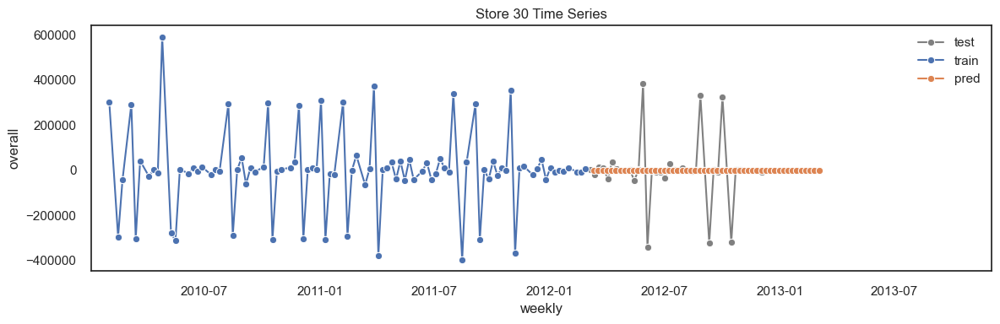

In [148]:
f, ax = plt.subplots(nrows=1, ncols=1, figsize=(12, 4))
sns.lineplot(data=trend_30[-test_len_30:], x='weekly', y='overall', marker='o', label='test', color='grey')
sns.lineplot(data=trend_30[:train_len_30], x='weekly', y='overall', marker='o', label='train')
sns.lineplot(data=pred_30_, x='weekly', y='predicted_values', marker='o', label='pred')
ax.set_xlim([trend_30['weekly'].iloc[0], trend_30['weekly'].iloc[-1]+pd.DateOffset(weeks=52)])
ax.set_title('Store 30 Time Series')
plt.tight_layout()
plt.show()